In [1]:
from __future__ import print_function
import numpy as np
import h5py
import glob
import math
import os
import shutil
from scipy import signal
from scipy.signal import butter, lfilter
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Conv1D, MaxPooling1D, UpSampling1D, Flatten, Dropout, Reshape 
from keras.layers import Bidirectional, BatchNormalization, ZeroPadding1D, Conv2DTranspose
from keras.models import Model
from keras import backend as K
from tensorflow.keras.optimizers import SGD, Adam
#from keras.optimizers import SGD, Adam
from keras import regularizers
#from keras.engine.topology import Layer, InputSpec
from tensorflow.keras.layers import Layer, InputSpec
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau, EarlyStopping
from keras.initializers import VarianceScaling
from keras.callbacks import CSVLogger
from scipy.optimize import linear_sum_assignment as linear_assignment
#from sklearn.utils.linear_assignment_ import linear_assignment
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import metrics
import matplotlib.pyplot as plt
from matplotlib.pyplot import savefig

import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('muted')

In [2]:
x = np.load('randstackSTFTnorm_2may-24june.npy') # Stack os the STFT of downsampled 8Hz
#y = np.load('labels.npy') # labels
#n_clusters = 6

x.shape

(5800, 256)

# Building the autoencoder

In [3]:
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import MaxPooling2D, Flatten, Reshape, UpSampling2D, Dropout, BatchNormalization
from keras.models import Model, Sequential
import keras.backend as K 

inp = Input(shape=( 256, 1))  
e = Conv1D(8, 5, activation='tanh', padding='same')(inp)
#e = BatchNormalization()(e)
e = MaxPooling1D(2, padding='same')(e)

e = Conv1D(16, 5, activation='tanh', padding='same')(e)
#e = BatchNormalization()(e)
e = MaxPooling1D(2, padding='same')(e)

e = Conv1D(32, 5, activation='tanh', padding='same')(e)
#e = MaxPooling1D(2, padding='same')(e)

shape_before_flattening = K.int_shape(e)
encoded = Flatten()(e)
d1 = Reshape([64,32])(encoded)

#encoded=e

#d = Conv1D(32, 4, activation='elu', padding='same')(d1)
#d = UpSampling1D(2)(d)

d = Conv1D(16, 5, activation='tanh', padding='same')(d1)
#d = BatchNormalization()(d)
d = UpSampling1D(2)(d)

d = Conv1D(8, 5, activation='tanh', padding='same')(d)
#d = BatchNormalization()(d)
d = UpSampling1D(2)(d)
decoded = Conv1D(1, 5, padding='same')(d)

autoencoder = Model(inputs=inp, outputs=decoded, name='autoencoder')
encoder = Model(inputs=inp, outputs=encoded, name='encoder')
#autoencoder.summary()

from keras.utils.vis_utils import plot_model
#from keras.utils import plot_model
plot_model(autoencoder, to_file='autoencoder.png', show_shapes=True)
from IPython.display import Image, display
Image(filename='autoencoder.png')
autoencoder.summary()

2022-07-06 09:58:00.199206: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 1)]          0         
                                                                 
 conv1d (Conv1D)             (None, 256, 8)            48        
                                                                 
 max_pooling1d (MaxPooling1D  (None, 128, 8)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 128, 16)           656       
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 64, 16)           0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 64, 32)            

# Pretraining of the autoencoder

In [4]:
opt = Adam(learning_rate= 1e-4)
autoencoder.compile(optimizer=opt, loss='mse')
csv_logger = CSVLogger('pretrain_log.csv')

autoencoder.fit(x, x, batch_size=128, epochs=50, callbacks=[csv_logger])

Epoch 1/50
46/46 [==============================] - 3s 28ms/step - loss: 2.7233e-04
Epoch 2/50
46/46 [==============================] - 1s 28ms/step - loss: 1.0012e-04
Epoch 3/50
46/46 [==============================] - 1s 27ms/step - loss: 7.5988e-05
Epoch 4/50
46/46 [==============================] - 1s 27ms/step - loss: 6.2129e-05
Epoch 5/50
46/46 [==============================] - 1s 27ms/step - loss: 5.4259e-05
Epoch 6/50
46/46 [==============================] - 1s 27ms/step - loss: 4.9474e-05
Epoch 7/50
46/46 [==============================] - 1s 28ms/step - loss: 4.6099e-05
Epoch 8/50
46/46 [==============================] - 1s 27ms/step - loss: 4.3391e-05
Epoch 9/50
46/46 [==============================] - 1s 29ms/step - loss: 4.1094e-05
Epoch 10/50
46/46 [==============================] - 1s 26ms/step - loss: 3.9068e-05
Epoch 11/50
46/46 [==============================] - 1s 26ms/step - loss: 3.7251e-05
Epoch 12/50
46/46 [==============================] - 1s 26ms/step - loss: 

# Check the autoencoder output

In [10]:
decoder = Model(inputs=encoded, outputs=decoded, name='decoder')

In [11]:
encoded_imgs = encoder.predict(x)
decoded_imgs = decoder.predict(encoded_imgs)

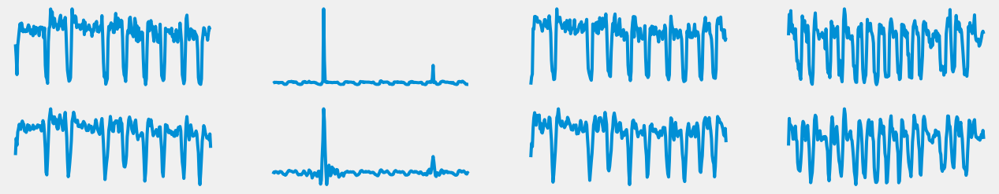

In [36]:

s=1
e=5
n = e-s
plt.figure(figsize=(20, 4))
for i in range(s,e):
    # Display original
    ax = plt.subplot(2, n, i-s + 1)
    plt.plot(x[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i-s + 1 + n)
    plt.plot(decoded_imgs[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


In [8]:
X_predict = autoencoder.predict(x)

In [ ]:
n_clusters = 2

In [ ]:
n_clusters = 3

In [ ]:
n_clusters = 4

In [20]:
n_clusters = 5

In [13]:
n_clusters = 6

In [7]:
n_clusters = 7

In [38]:
n_clusters = 8

In [45]:
n_clusters = 9

In [51]:
n_clusters = 10

In [19]:
n_clusters = 11

In [83]:
n_clusters = 12

# Now, adding the clustering layer into the bottelneck layer 

...Finetuning...


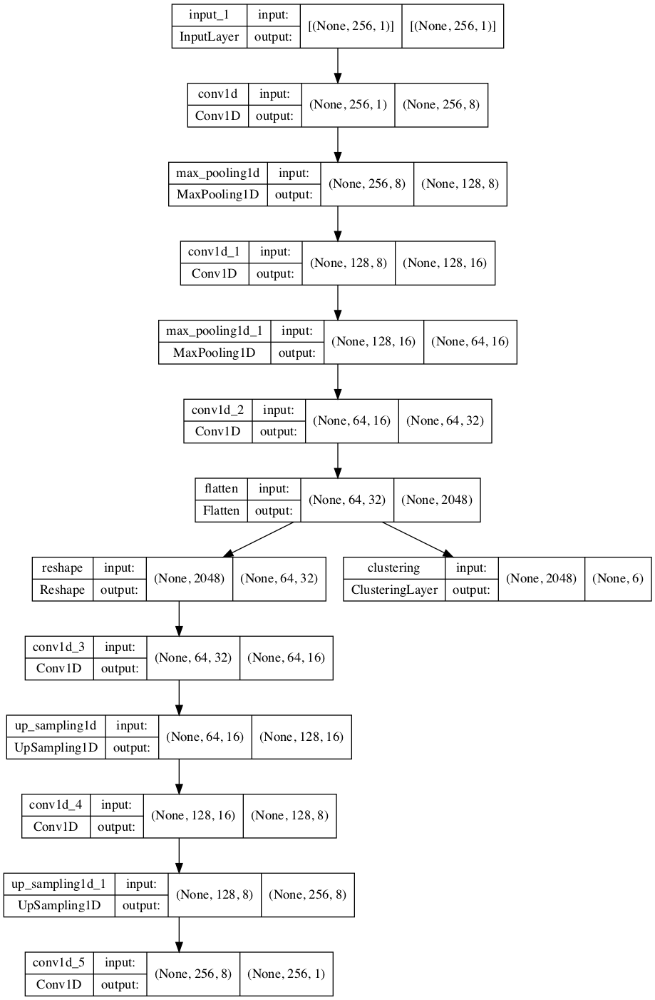

In [14]:
#### clustering layers
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        if 'input_shape' not in kwargs and 'input_dim' in kwargs:
            kwargs['input_shape'] = (kwargs.pop('input_dim'),)
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights
        self.input_spec = InputSpec(ndim=2)

    def build(self, input_shape):
        assert len(input_shape) == 2#2
        input_dim = input_shape[1]
        self.input_spec = InputSpec(dtype=K.floatx(), shape=(None, input_dim))
        self.clusters = self.add_weight(shape=(self.n_clusters, input_dim), initializer='glorot_uniform', name='clusters')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        self.built = True

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1)) 
        return q
    
    
    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 1#2
        return input_shape[0], self.n_clusters

    def get_config(self):
        config = {'n_clusters': self.n_clusters}
        base_config = super(ClusteringLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
print('...Finetuning...')   
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(encoder.output)
model = Model(inputs=encoder.input, outputs=[clustering_layer, autoencoder.output])
model.compile(loss=['kld', 'mse'], loss_weights=[0.2, 1], optimizer= opt)

#from keras.utils import plot_model
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)
from IPython.display import Image
Image(filename='model.png')

In [15]:
### initializing the weights using Kmean and assigning them to the model
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(encoder.predict(x))
y_pred_last = np.copy(y_pred)
model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

In [16]:
## parameters for the finetuning
batch_size= 258
tol = 0.001 # tolerance threshold to stop training
loss = 0
index = 0
maxiter =5000
update_interval = 150
index_array = np.arange(x.shape[0])

###############################################################################
### simultaneous optimization and clustering
def target_distribution(q):
    weight = q ** 2 / q.sum(0)
    return (weight.T / weight.sum(1)).T

for ite in range(int(maxiter)):
    if ite % update_interval == 0:
        q, _  = model.predict(x, verbose=0)
        p = target_distribution(q)  # update the auxiliary target distribution p       
        y_pred = q.argmax(1) # evaluate the clustering performance

        if 1:
            #acc = np.round(metrics.acc(y, y_pred), 5)
            loss = np.round(loss, 5)
            print('Iter %d: ' % (ite), ' ; loss=', loss)

        # check stop criterion
        delta_label = np.sum(y_pred != y_pred_last).astype(np.float32) / y_pred.shape[0]
        y_pred_last = np.copy(y_pred)

        if ite > 0 and delta_label < tol:
            print('delta_label ', delta_label, '< tol ', tol)
            break
        
        IN = encoder.predict(x)        
    
    idx = index_array[index * batch_size: min((index+1) * batch_size, x.shape[0])]
    loss = model.train_on_batch(x=x[idx], y=[p[idx], x[idx]])
    index = index + 1 if (index + 1) * batch_size <= x.shape[0] else 0  


Iter 0:   ; loss= 0
Iter 150:   ; loss= [6.0e-05 2.6e-04 1.0e-05]
Iter 300:   ; loss= [0.0007  0.00296 0.00011]
Iter 450:   ; loss= [2.3e-04 1.1e-03 1.0e-05]
Iter 600:   ; loss= [8.40e-04 4.16e-03 1.00e-05]
Iter 750:   ; loss= [4.840e-03 2.373e-02 9.000e-05]
Iter 900:   ; loss= [1.02e-03 5.00e-03 2.00e-05]
Iter 1050:   ; loss= [4.70e-04 2.31e-03 1.00e-05]
Iter 1200:   ; loss= [1.09e-03 5.42e-03 1.00e-05]
Iter 1350:   ; loss= [1.56e-03 7.61e-03 4.00e-05]
Iter 1500:   ; loss= [2.150e-03 1.069e-02 1.000e-05]
Iter 1650:   ; loss= [2.700e-03 1.344e-02 1.000e-05]
Iter 1800:   ; loss= [2.180e-03 1.082e-02 1.000e-05]
Iter 1950:   ; loss= [0.00151 0.00751 0.     ]
Iter 2100:   ; loss= [2.290e-03 1.138e-02 1.000e-05]
Iter 2250:   ; loss= [3.420e-03 1.706e-02 1.000e-05]
Iter 2400:   ; loss= [2.800e-03 1.381e-02 4.000e-05]
Iter 2550:   ; loss= [0.00174 0.00869 0.     ]
Iter 2700:   ; loss= [1.92e-03 9.56e-03 1.00e-05]
Iter 2850:   ; loss= [0.00457 0.02285 0.     ]
Iter 3000:   ; loss= [1.15e-03 5.

# Predefine number of clusters and calculate the Silhoutte Score

In [68]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.48987272


In [62]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 3 The average silhouette_score is : 0.48358208


In [19]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 4 The average silhouette_score is : 0.48643008


In [25]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 5 The average silhouette_score is : 0.40652955


In [22]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 6 The average silhouette_score is : 0.50854385


In [37]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 7 The average silhouette_score is : 0.505553


In [44]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 8 The average silhouette_score is : 0.46945408


In [50]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 9 The average silhouette_score is : 0.46984416


In [56]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 10 The average silhouette_score is : 0.39450064


In [82]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 11 The average silhouette_score is : 0.39713725


In [88]:
print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 12 The average silhouette_score is : 0.3971869


In [23]:
from sklearn.metrics import silhouette_samples, silhouette_score

### initializing the weights using Kmean and assigning them to the model
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(encoder.predict(x))
y_pred_last = np.copy(y_pred)
model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

cluster_labels = kmeans.fit_predict(encoder.predict(x))
silhouette_avg = silhouette_score(encoder.predict(x), cluster_labels)

For n_clusters = 4 The average silhouette_score is : 0.5096498
For n_clusters = 5 The average silhouette_score is : 0.51177126
For n_clusters = 6 The average silhouette_score is : 0.50854385
For n_clusters = 7 The average silhouette_score is : 0.4152294
For n_clusters = 8 The average silhouette_score is : 0.4147837
For n_clusters = 9 The average silhouette_score is : 0.41495085
For n_clusters = 10 The average silhouette_score is : 0.3223002


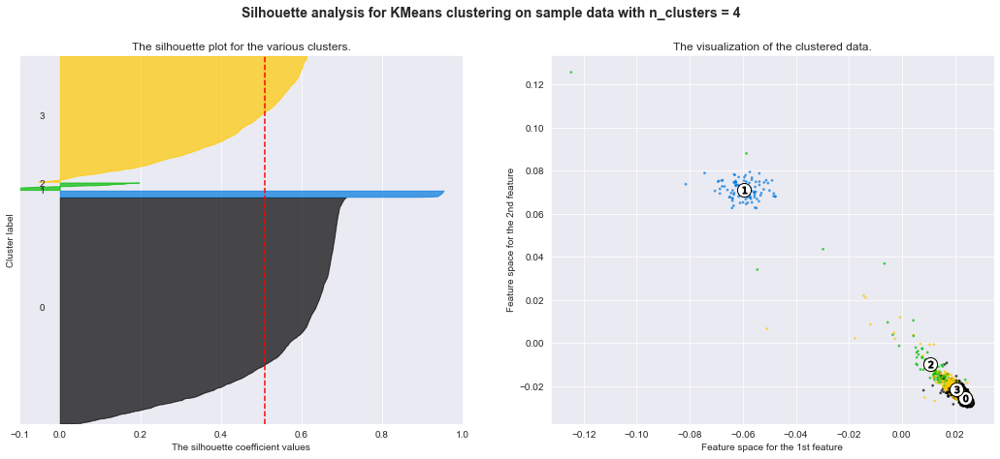

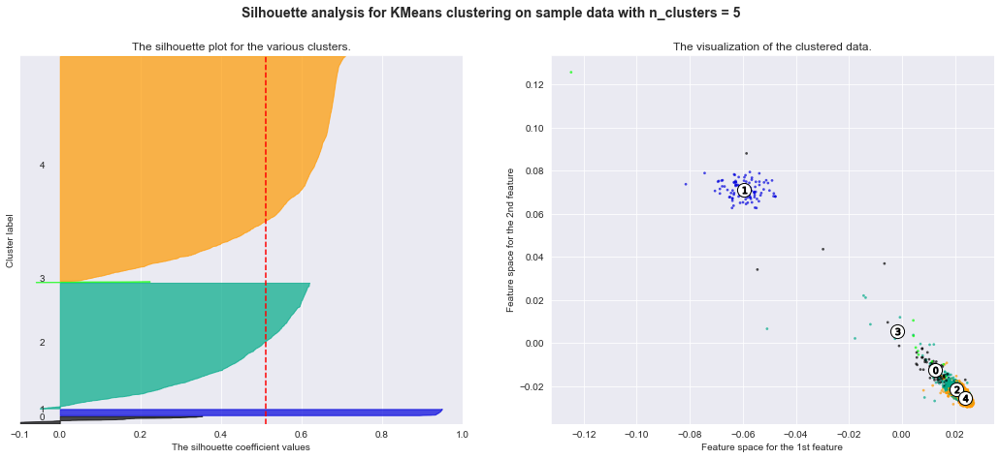

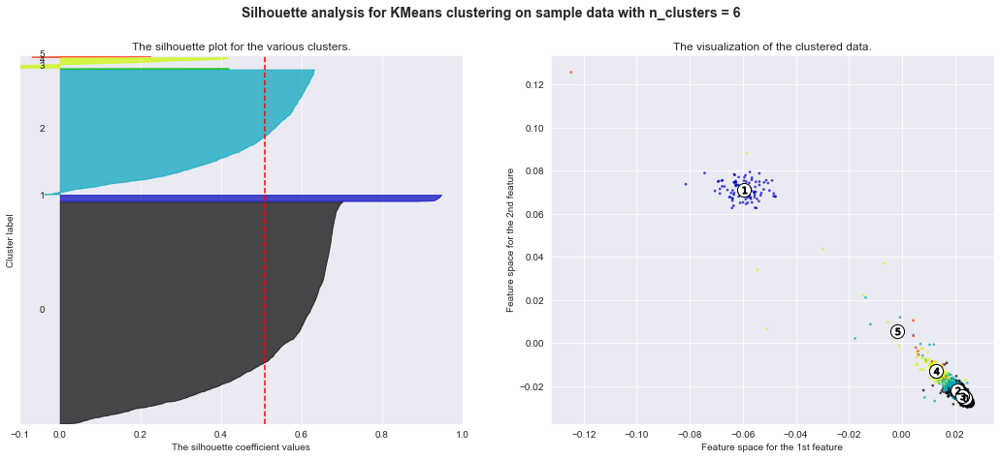

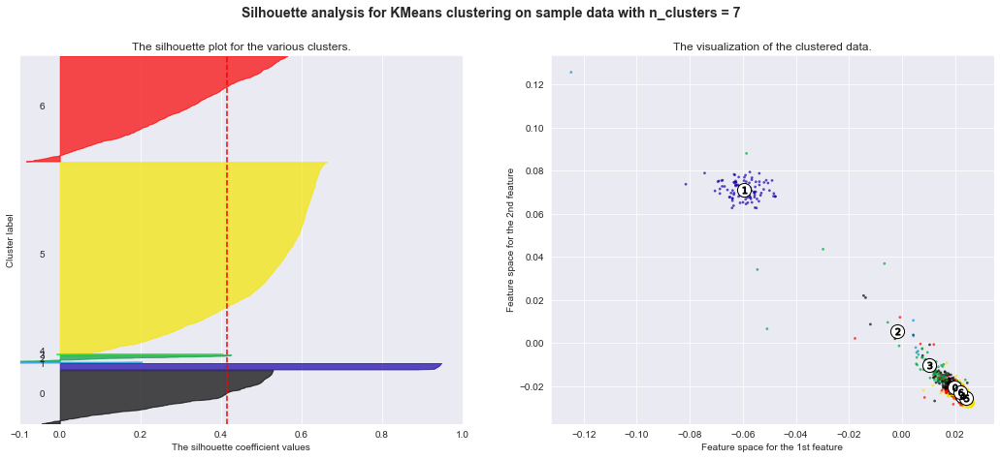

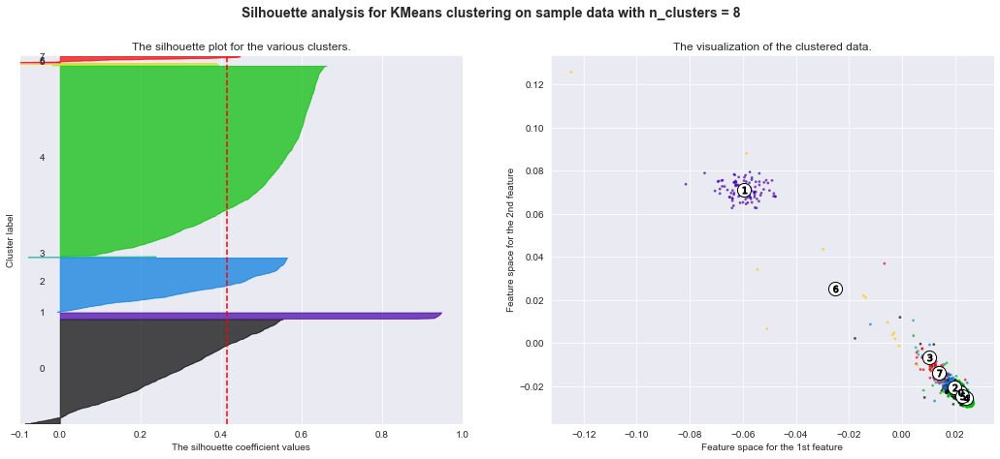

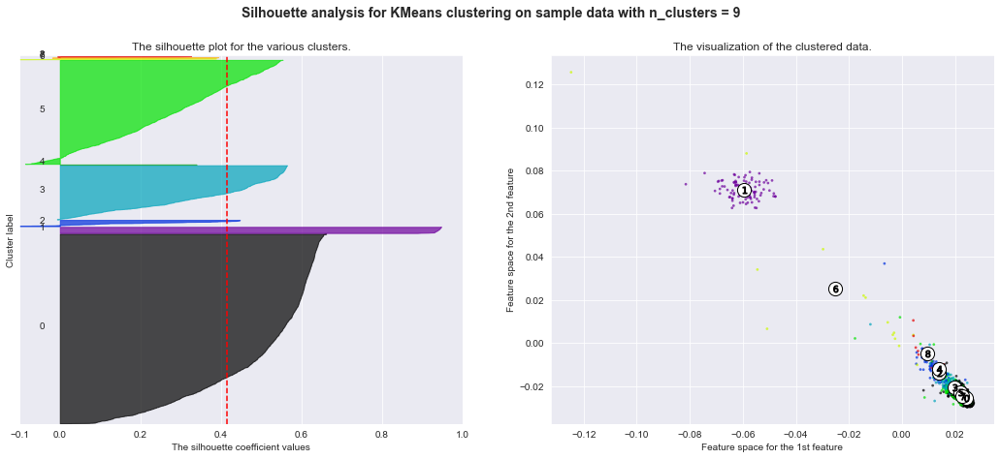

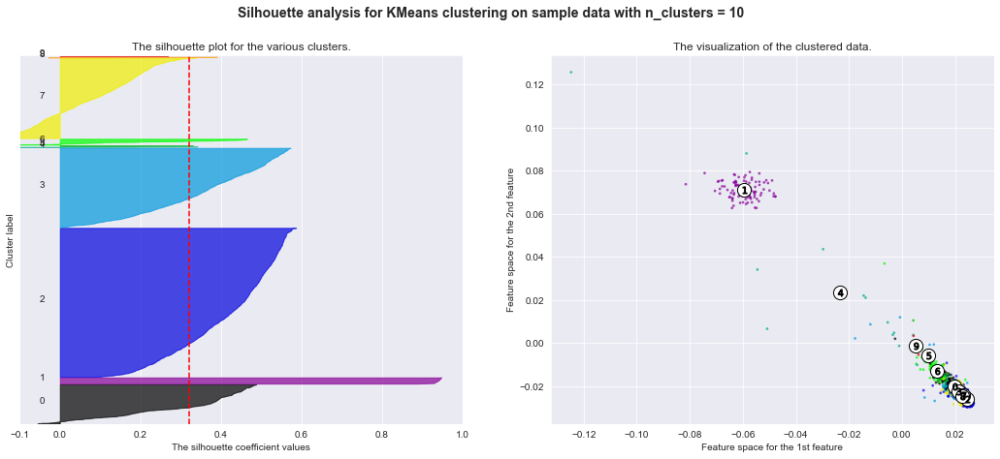

In [24]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


range_n_clusters = [4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(encoder.predict(x)) + (n_clusters + 1) * 10])


    kmeans = KMeans(n_clusters=n_clusters, n_init=20)
    
    ####cluster_labels = clusterer.fit_predict(x)
    y_pred = kmeans.fit_predict(encoder.predict(x))
    y_pred_last = np.copy(y_pred)
    #model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    cluster_labels = kmeans.fit_predict(encoder.predict(x))
    #####silhouette_avg = silhouette_score(x, cluster_labels)
    silhouette_avg = silhouette_score(encoder.predict(x), cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(encoder.predict(x), cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        encoder.predict(x)[:, 0], encoder.predict(x)[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    centers = kmeans.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )
    fig.savefig ( 'kmeancluster-avesil-n='+ str (n_clusters)+'.png', dpi= 100)
plt.show()


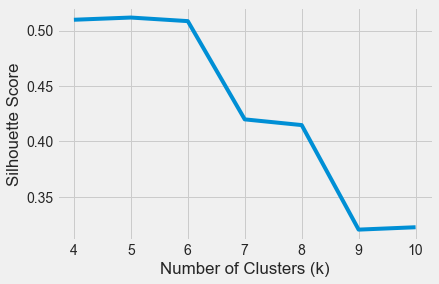

In [25]:
import matplotlib.style as style

range_n_clusters = [4, 5, 6, 7, 8, 9, 10]
score=[]
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, n_init=20)
    y_pred = kmeans.fit_predict(encoder.predict(x))
    y_pred_last = np.copy(y_pred)
    cluster_labels = kmeans.fit_predict(encoder.predict(x))
    silhouette_avg = silhouette_score(encoder.predict(x), cluster_labels)
    score.append(silhouette_avg)
style.use("fivethirtyeight")
plt.plot(range_n_clusters, score)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.show()

In [26]:
x2= np.zeros((5800,2, 256), dtype=np.complex_)
x2[:,0,:]=x2[:,1,:]=x[:,:]

In [27]:
decoded_imgs2= np.zeros((5800,2, 256,1), dtype=np.complex_)
decoded_imgs2[:,0,:]=decoded_imgs2[:,1,:]=decoded_imgs[:,:]

# Plotting the embedded layer

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


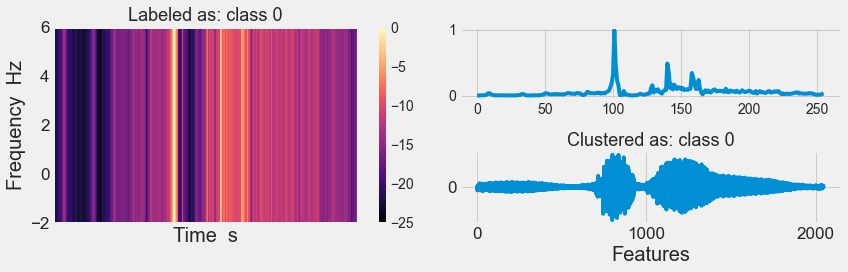

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


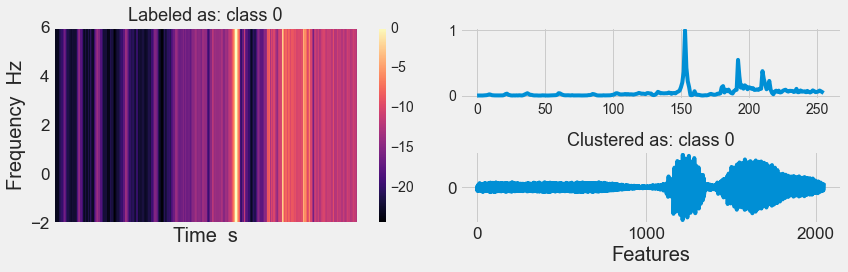

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


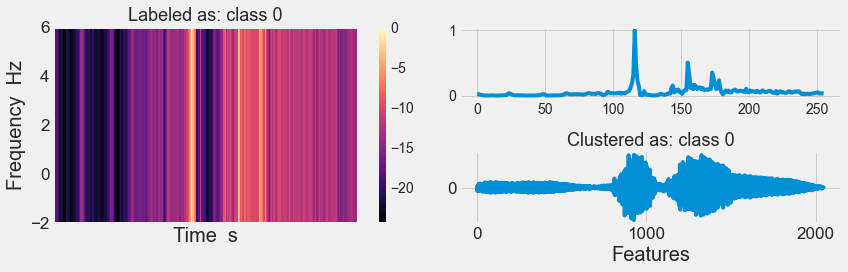

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


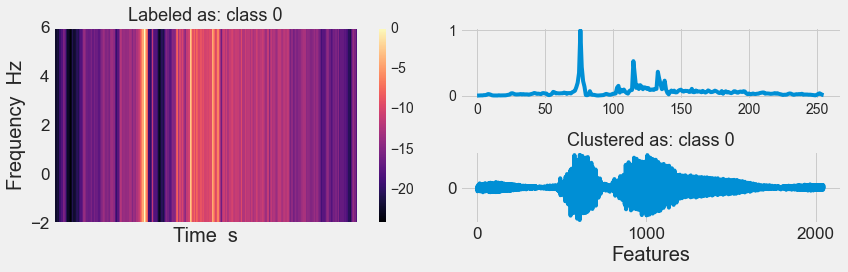

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


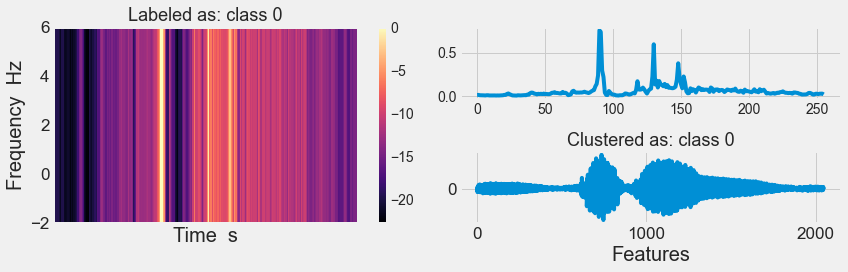

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


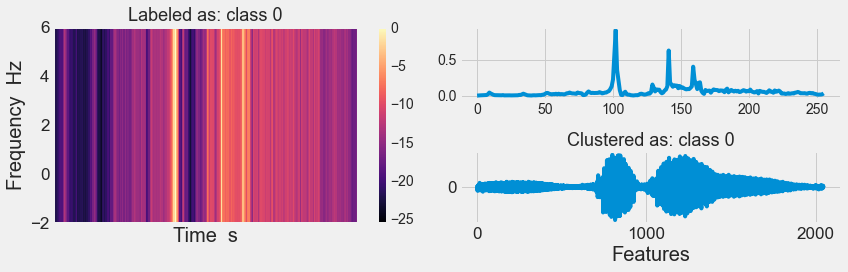

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


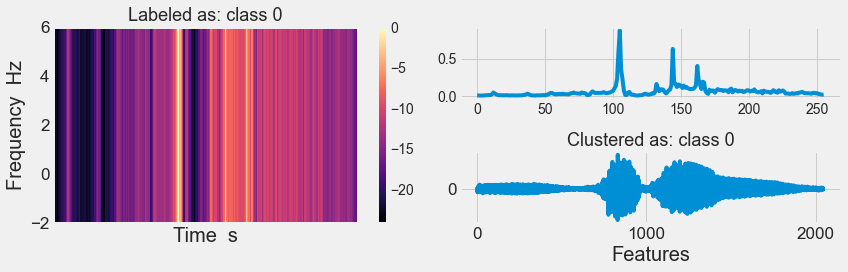

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


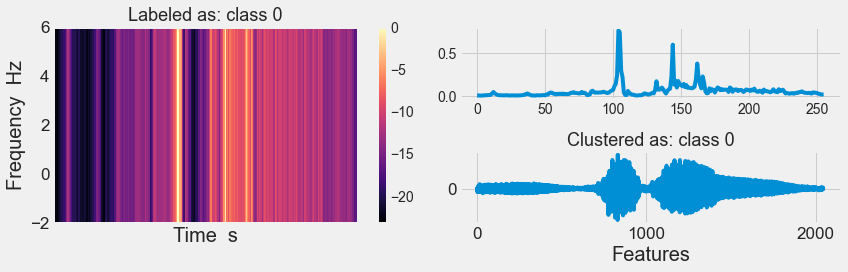

In [83]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5799, 1):    
    
    if y_pred[i] == 0:
        fig = plt.figure(figsize=(12, 4))
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 0', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 2048), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 0', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


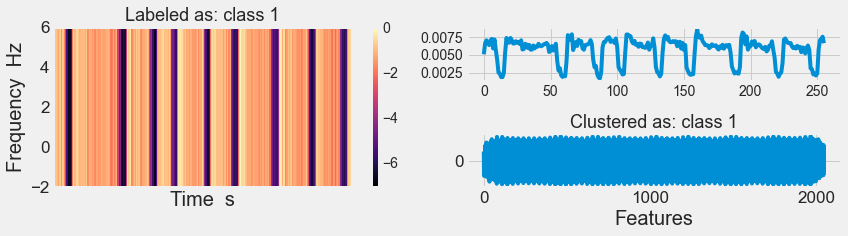

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


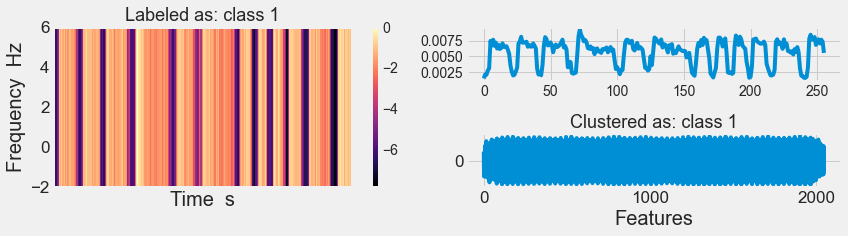

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


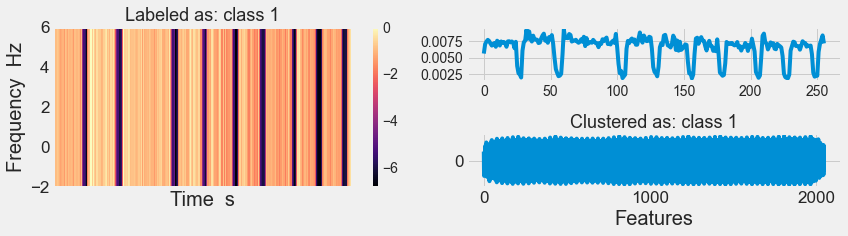

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


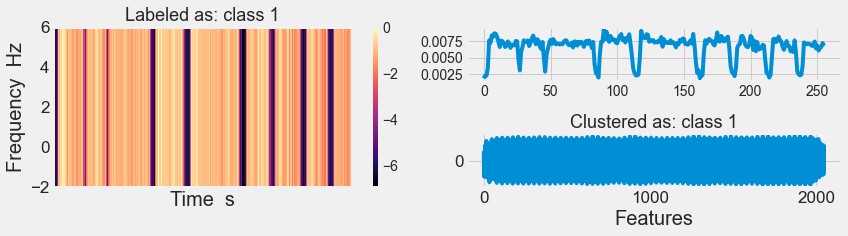

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


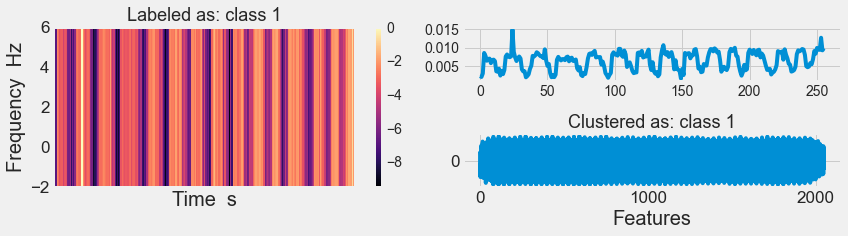

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


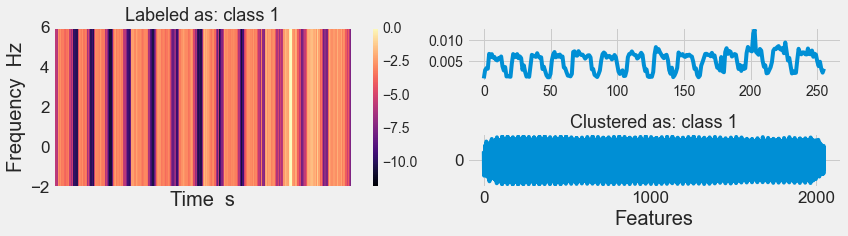

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


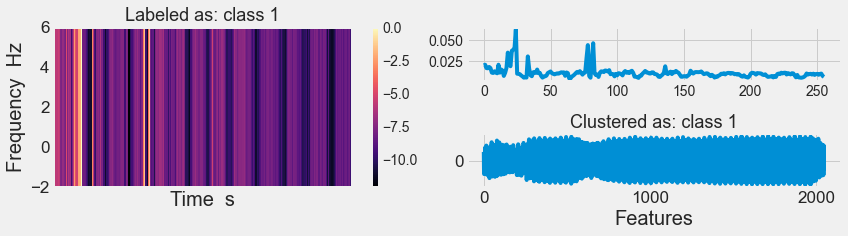

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


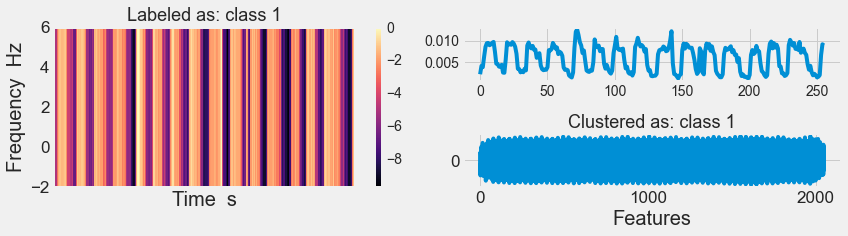

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


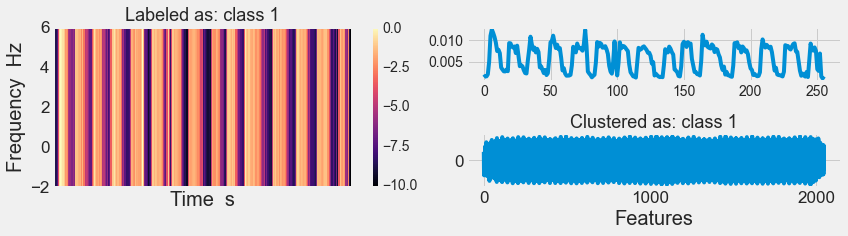

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


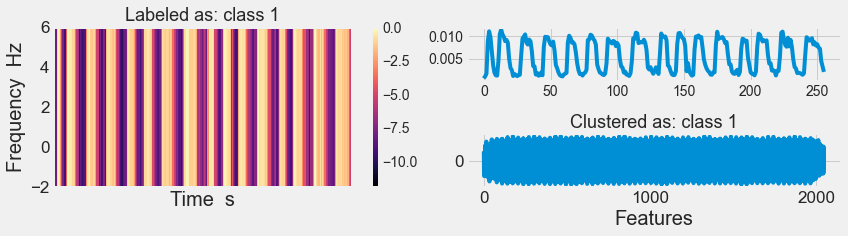

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


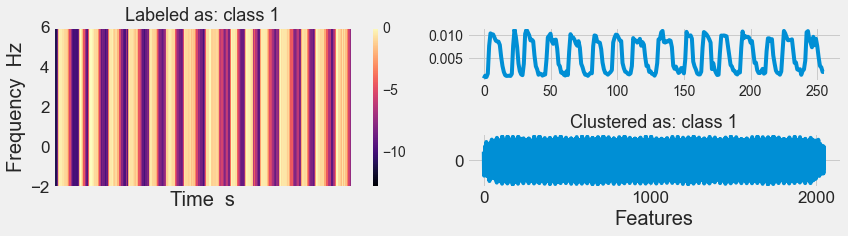

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


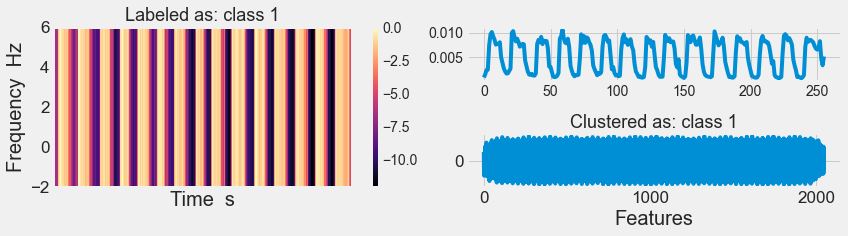

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


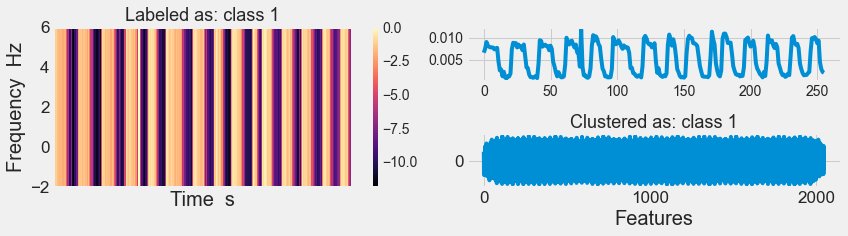

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


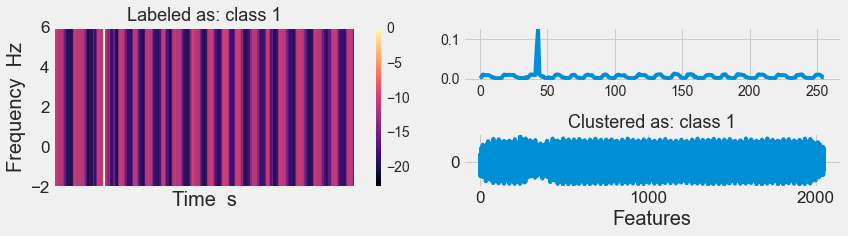

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


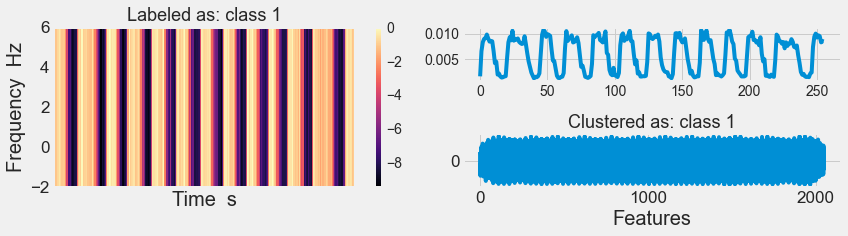

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


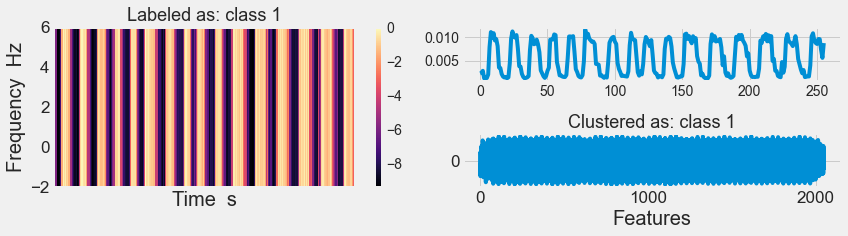

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


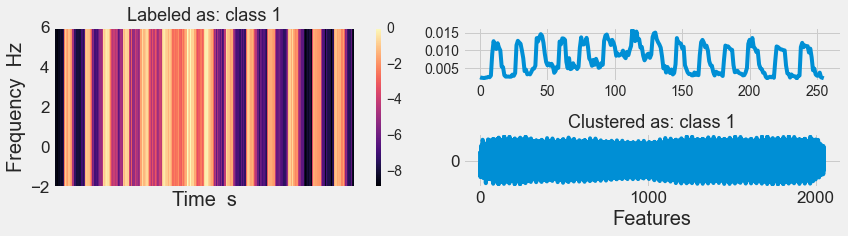

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


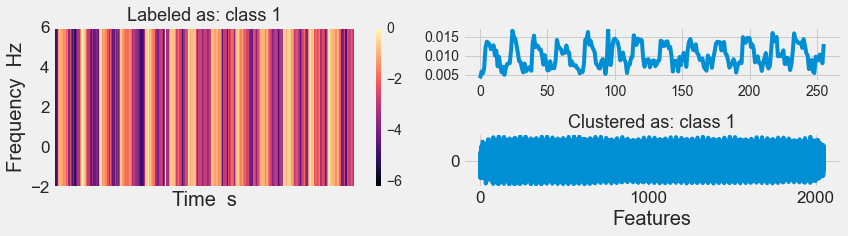

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


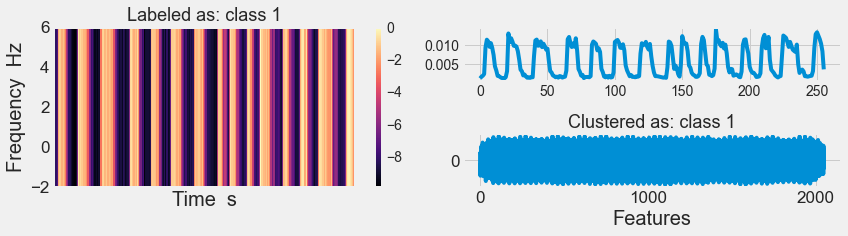

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


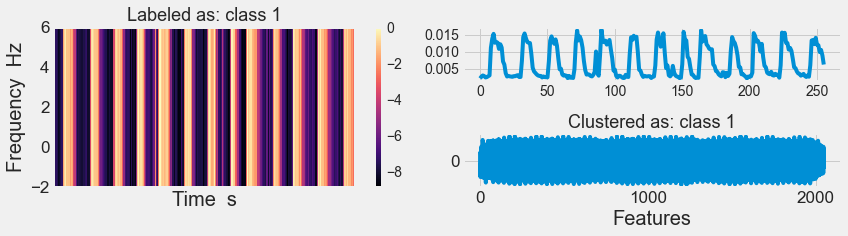

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


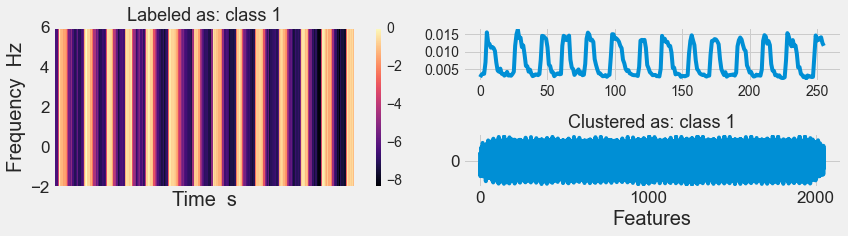

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


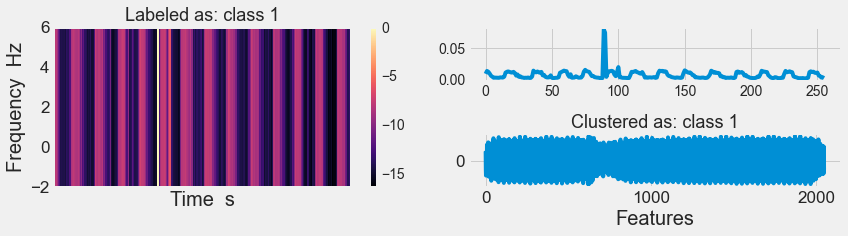

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


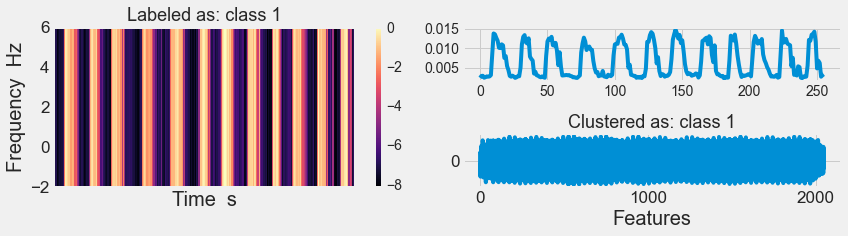

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


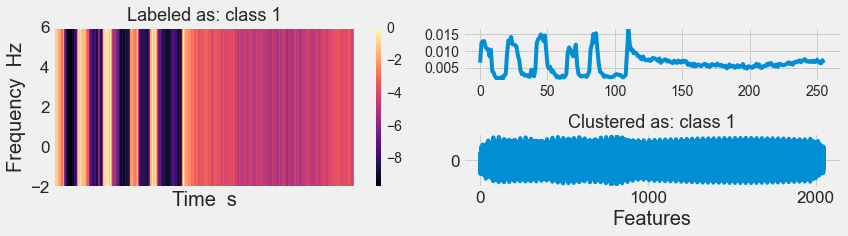

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


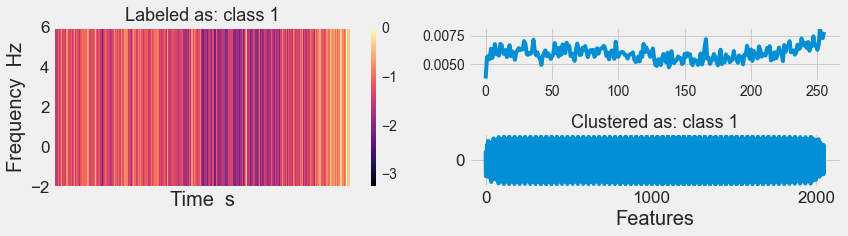

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


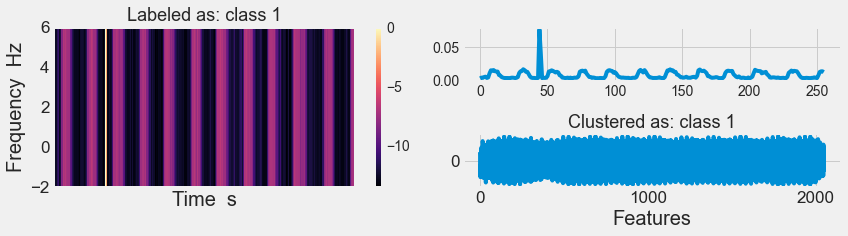

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


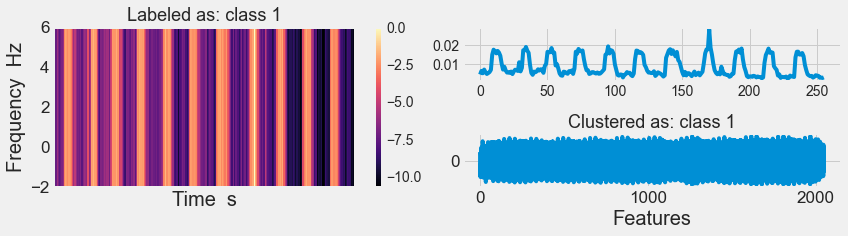

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


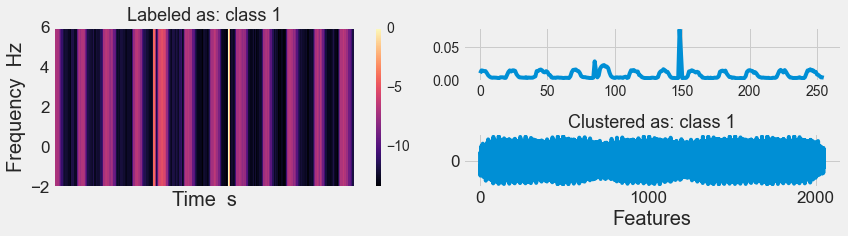

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


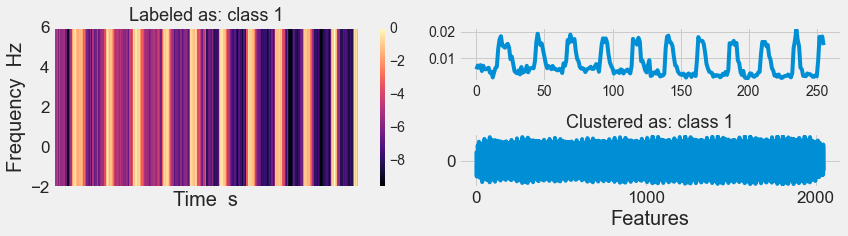

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


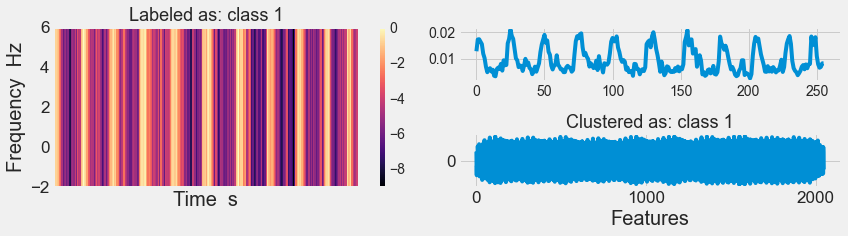

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


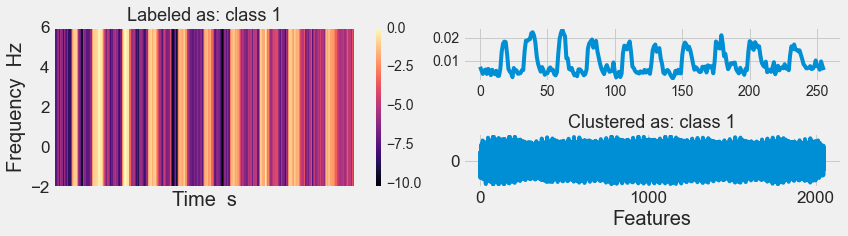

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


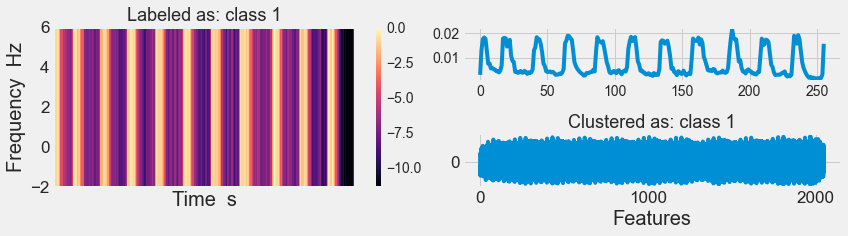

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


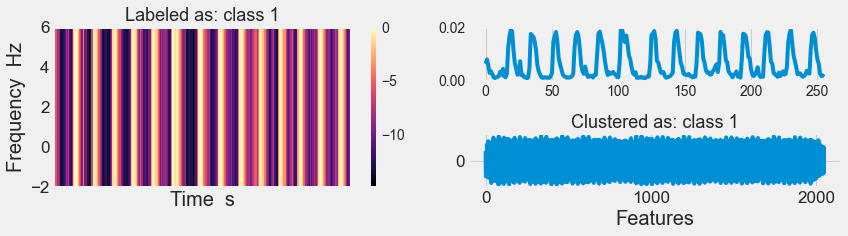

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


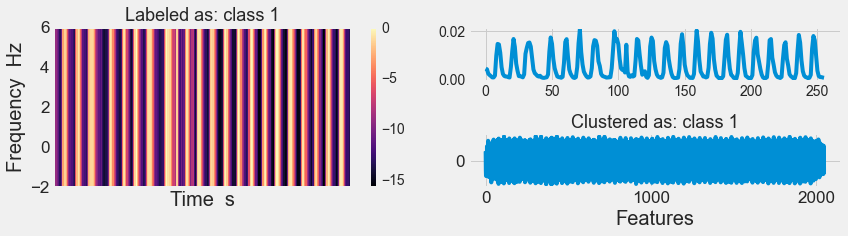

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


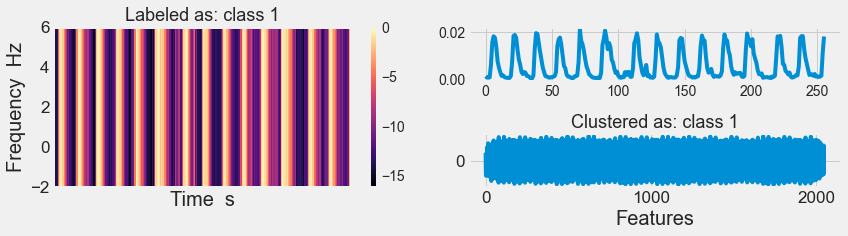

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


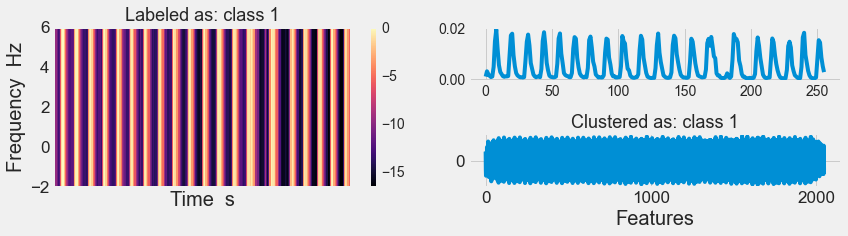

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


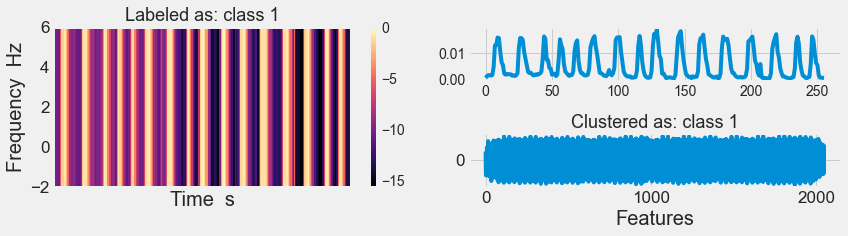

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


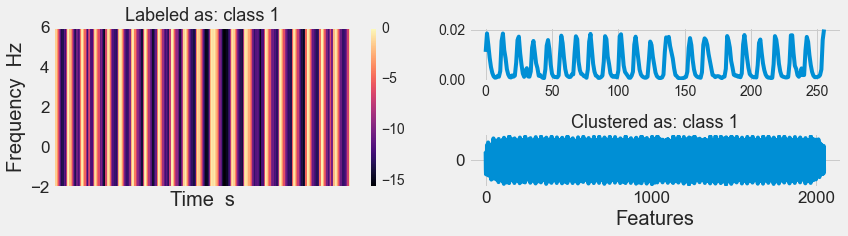

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


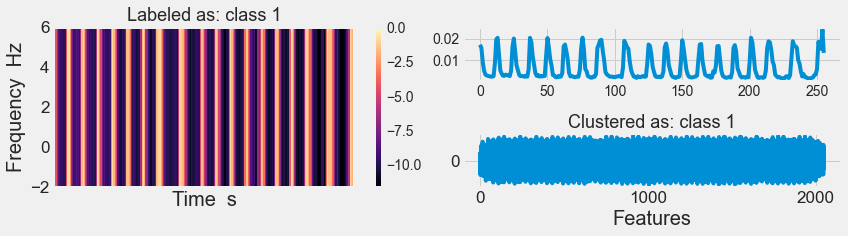

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


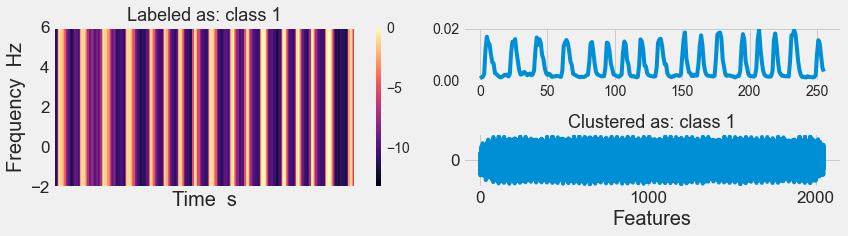

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


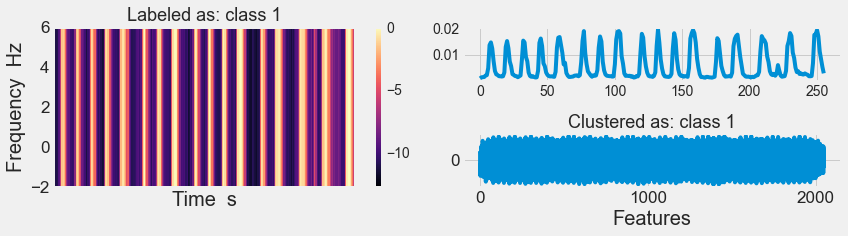

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


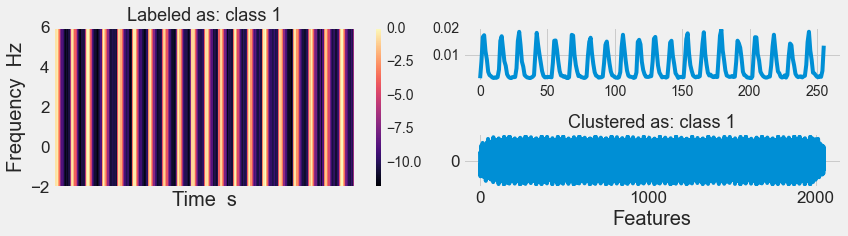

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


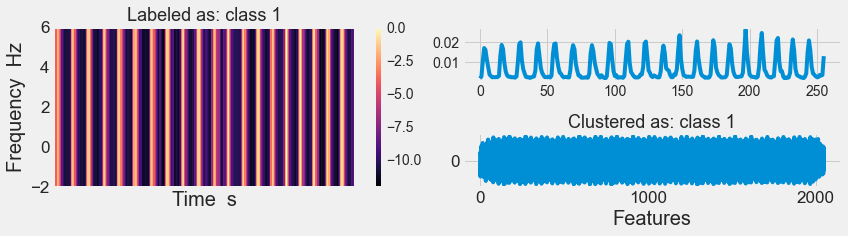

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


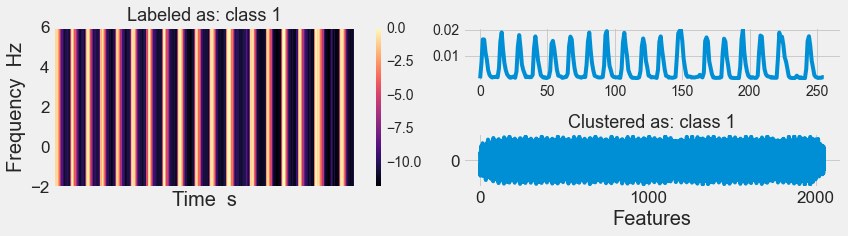

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


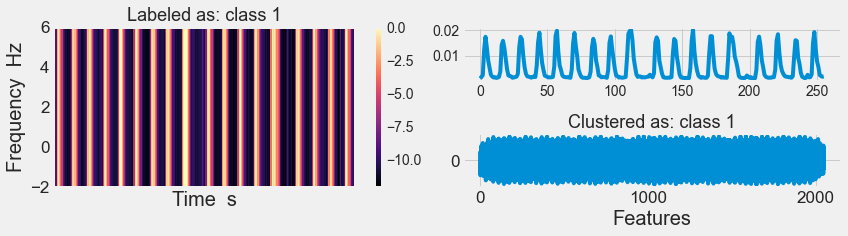

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


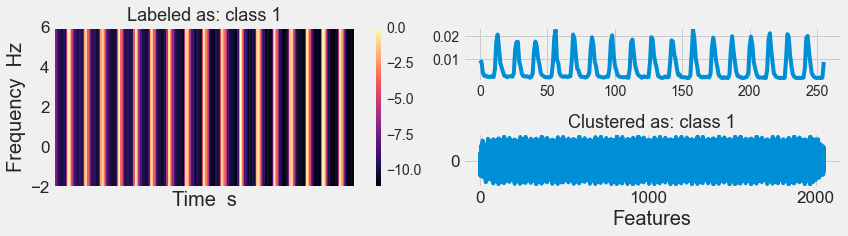

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


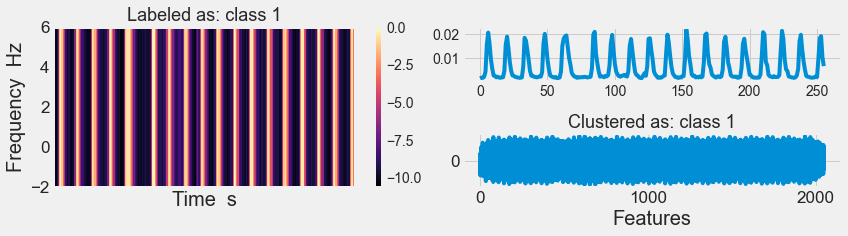

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


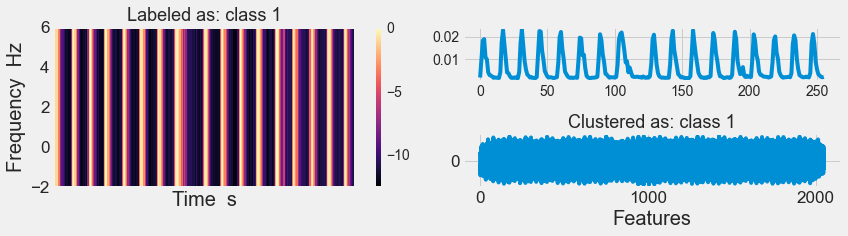

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


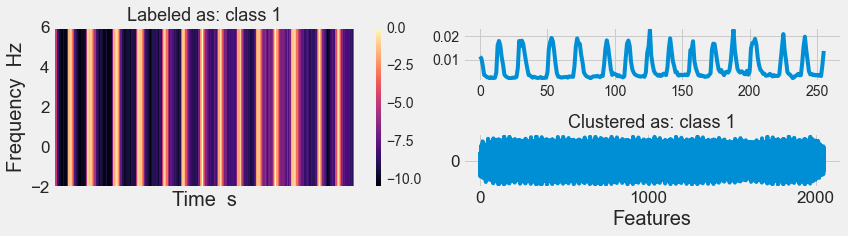

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


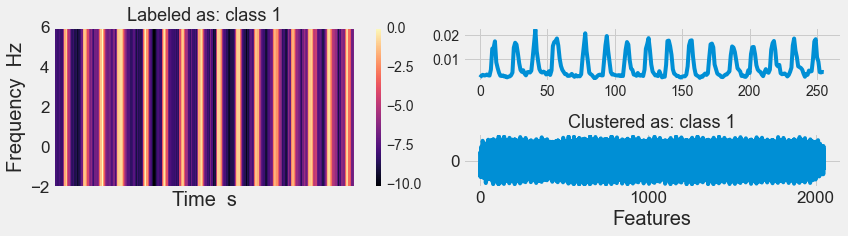

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


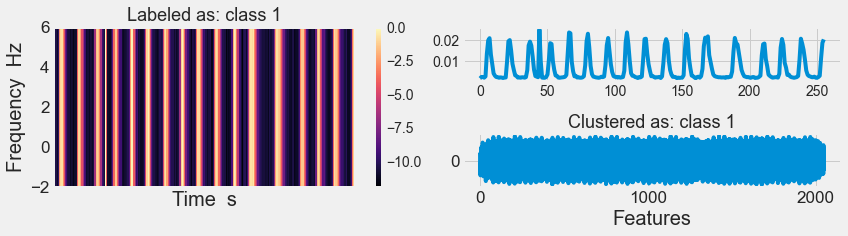

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


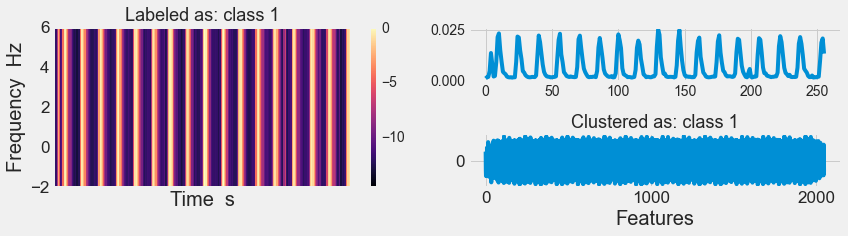

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


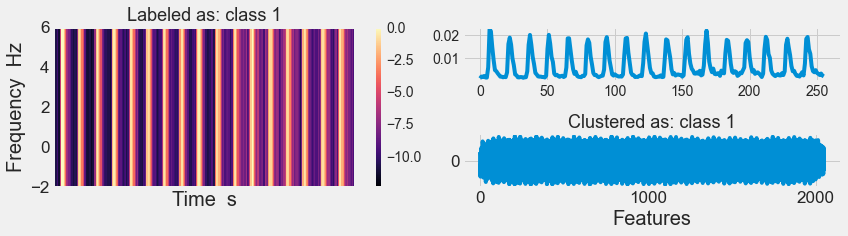

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


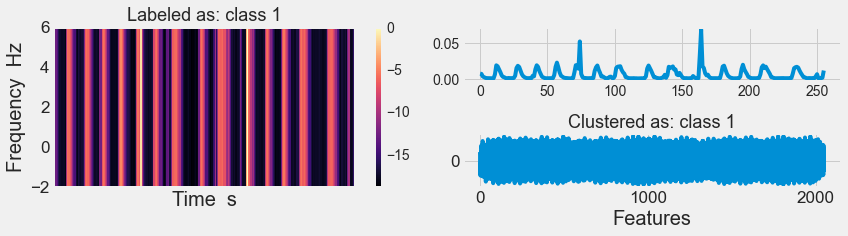

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


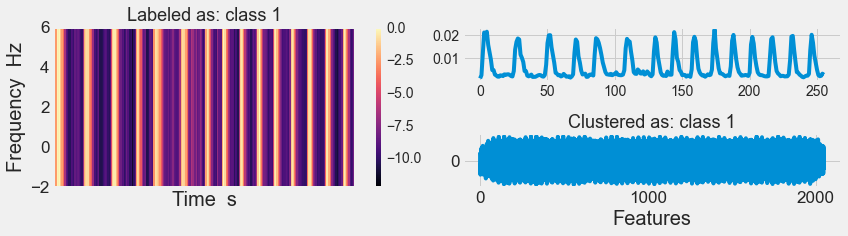

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


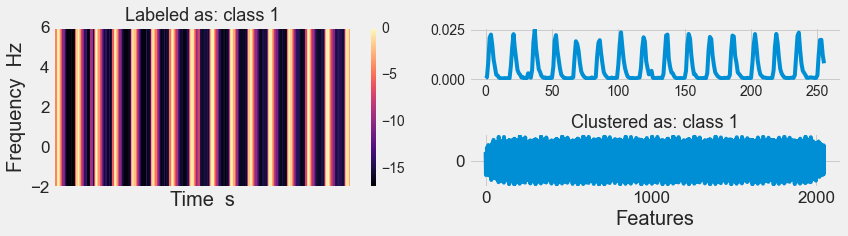

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


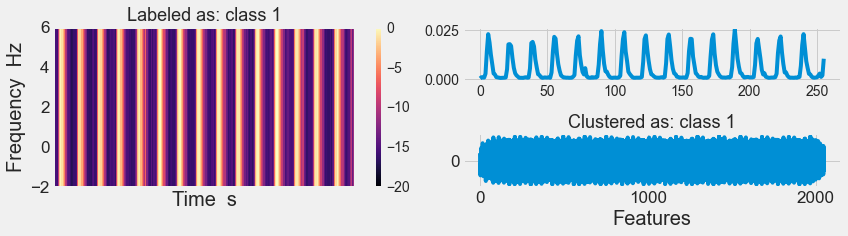

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


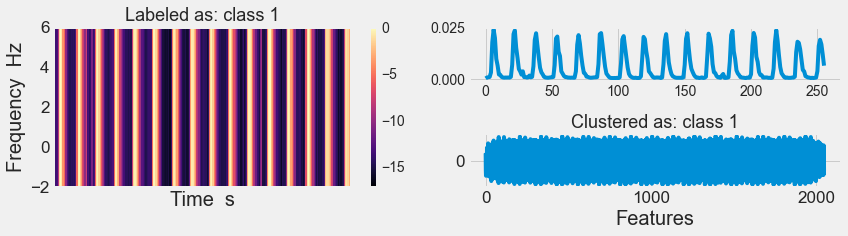

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


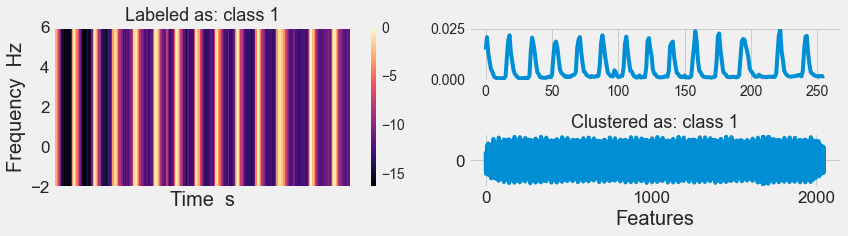

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


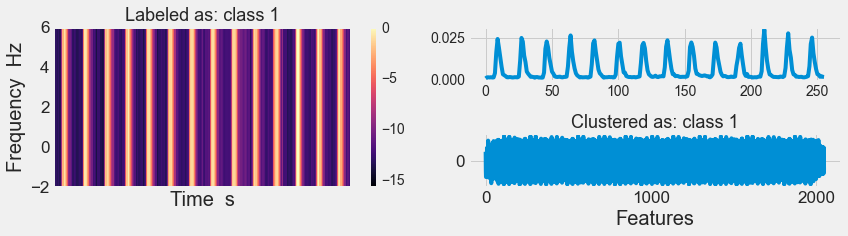

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


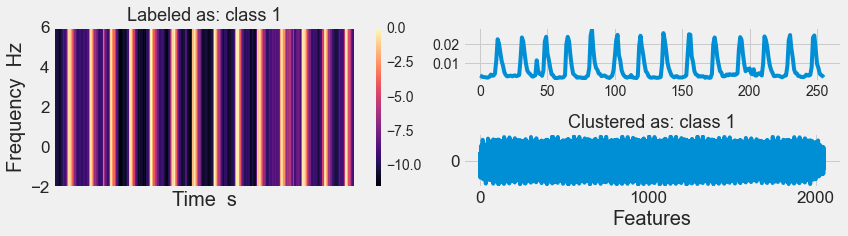

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


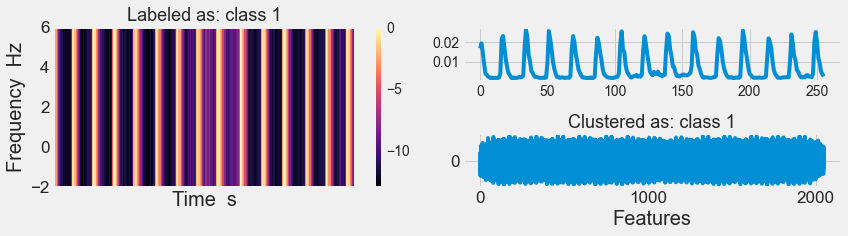

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


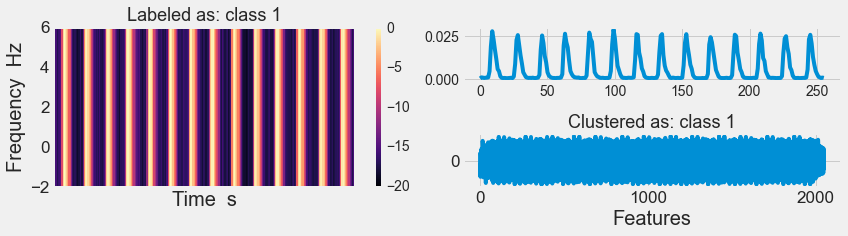

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


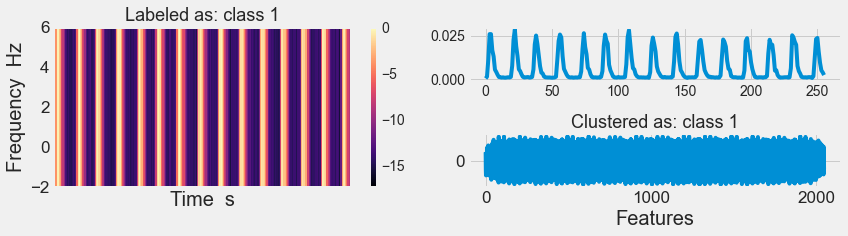

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


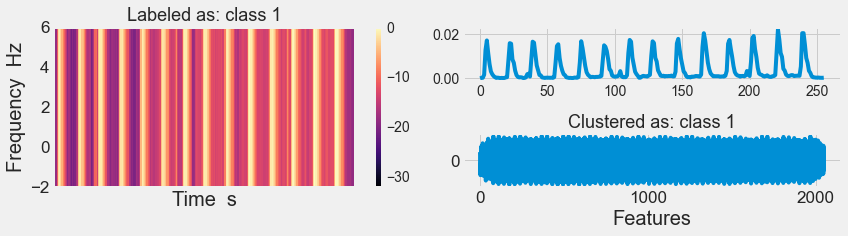

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


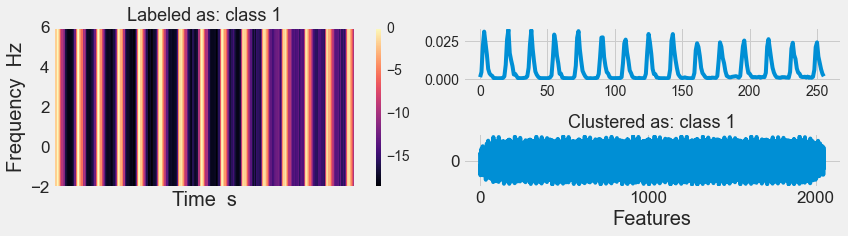

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


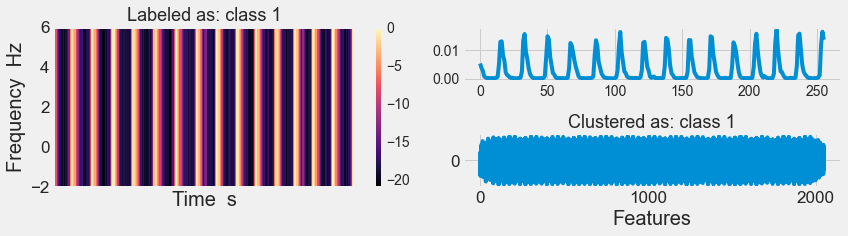

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


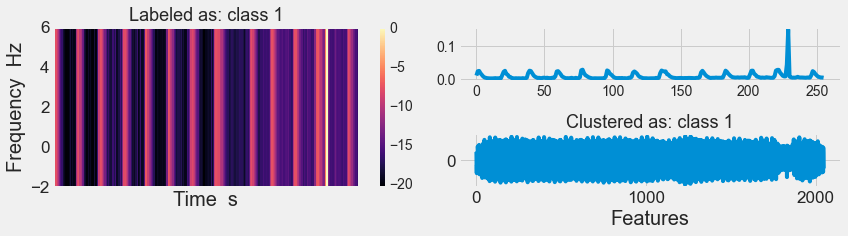

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


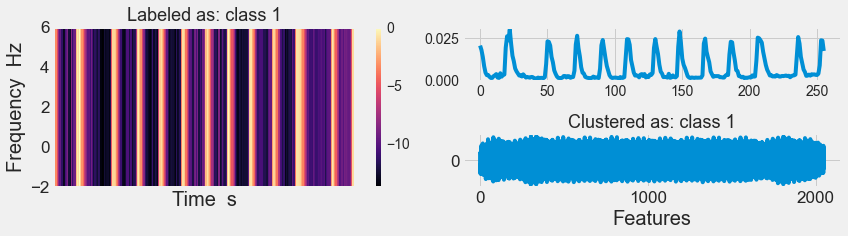

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


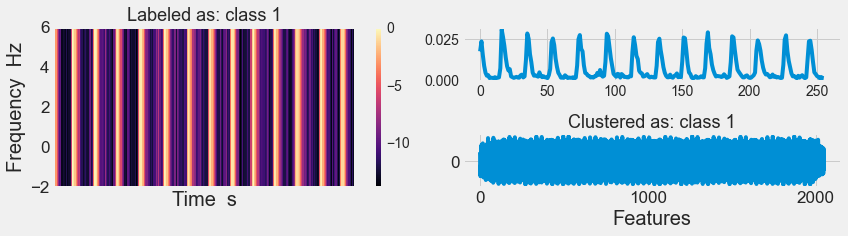

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


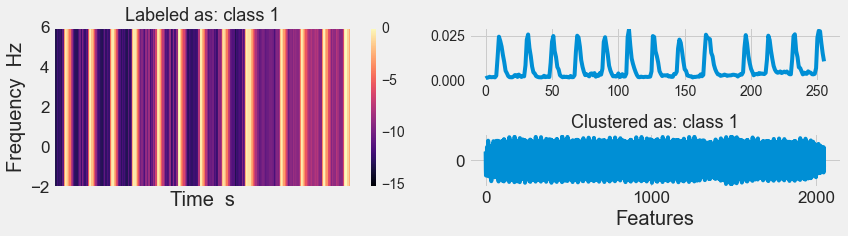

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


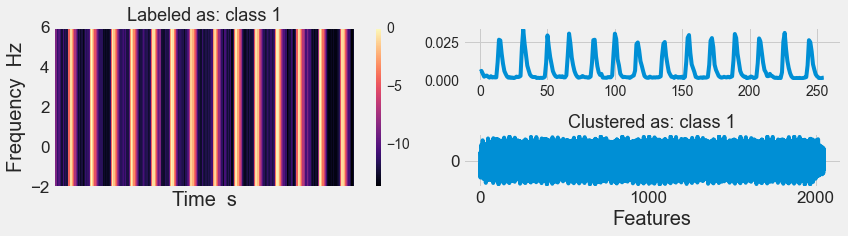

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


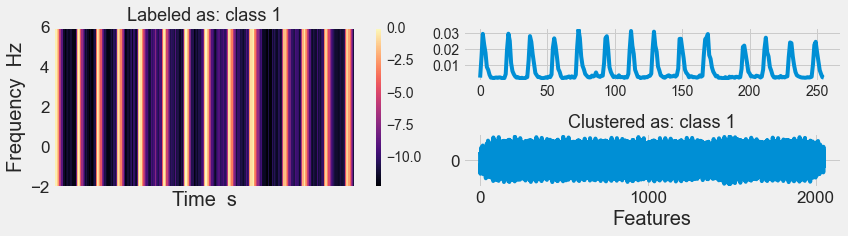

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


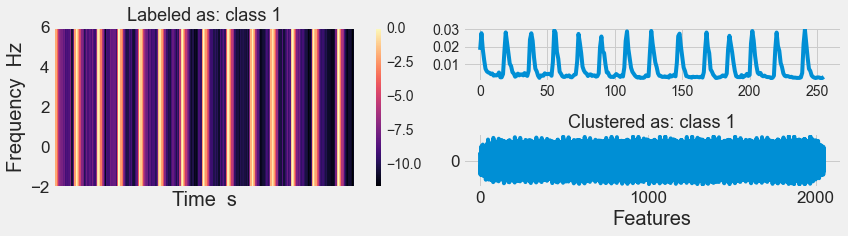

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


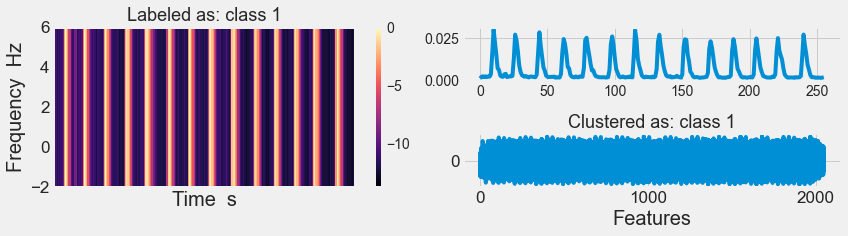

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


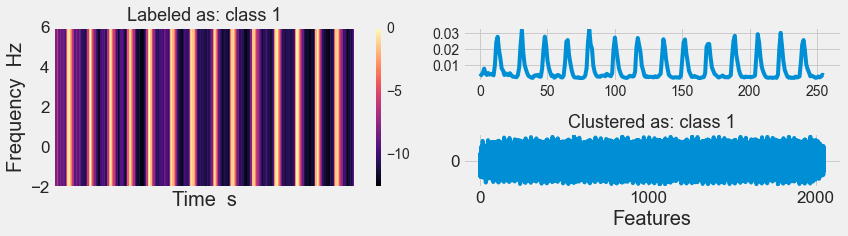

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


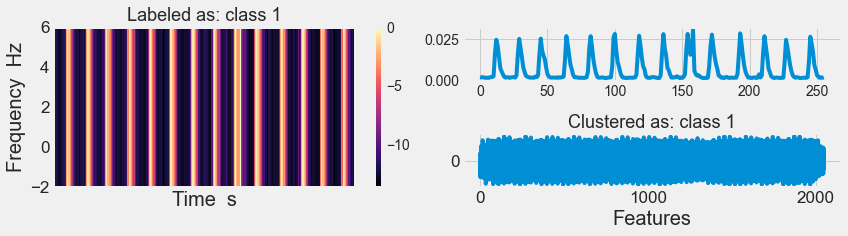

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


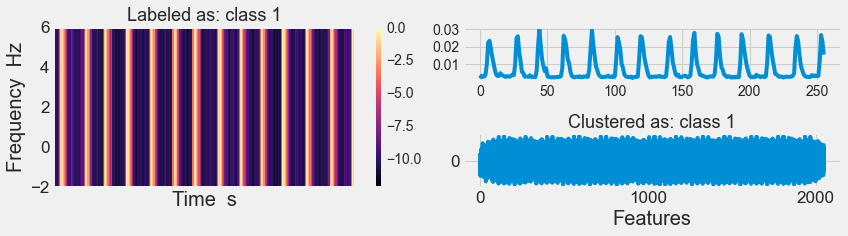

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


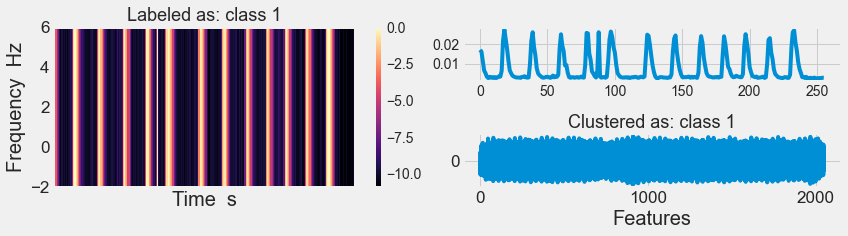

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


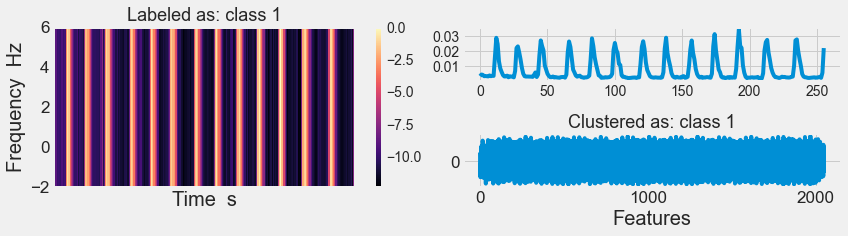

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


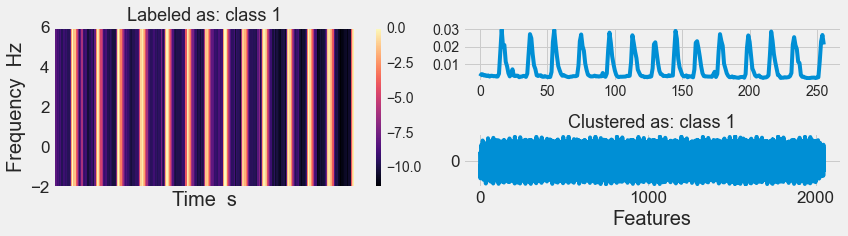

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


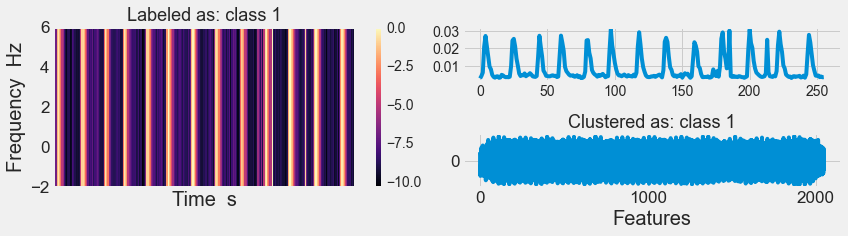

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


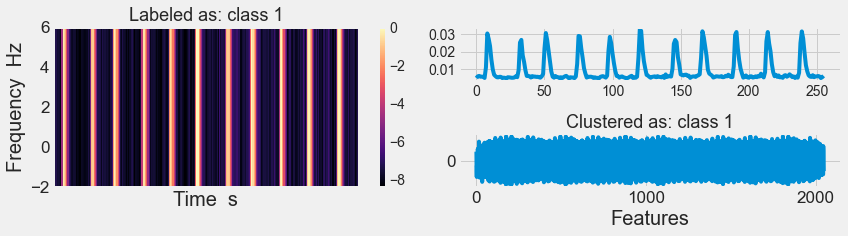

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


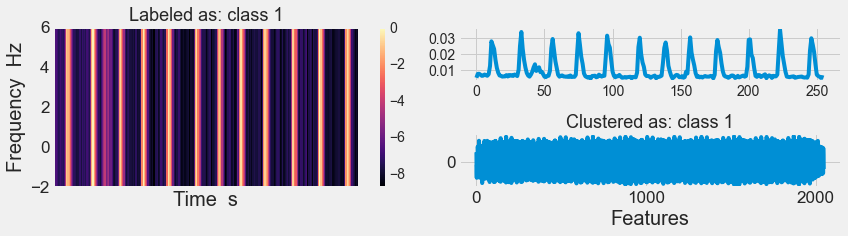

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


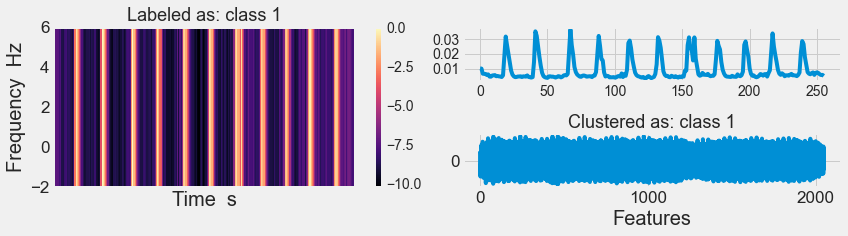

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


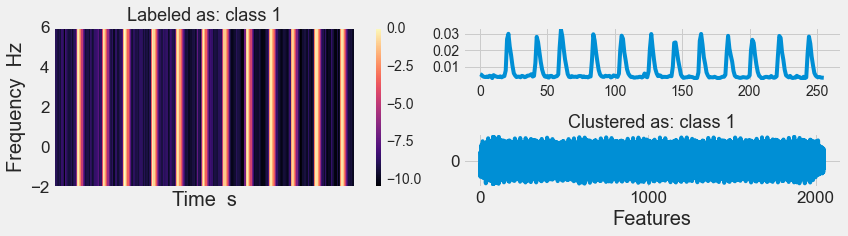

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


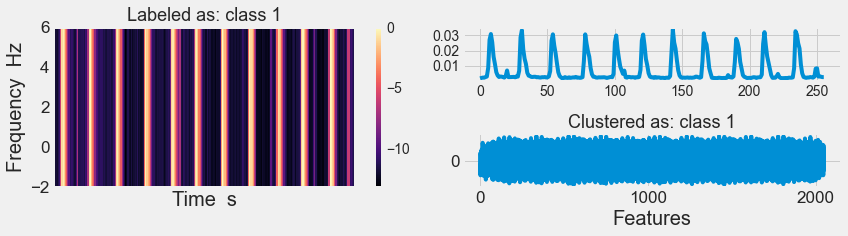

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


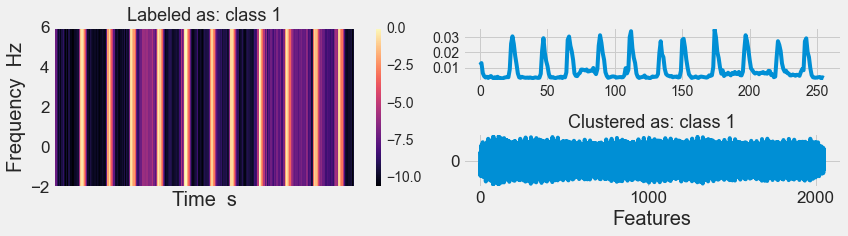

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


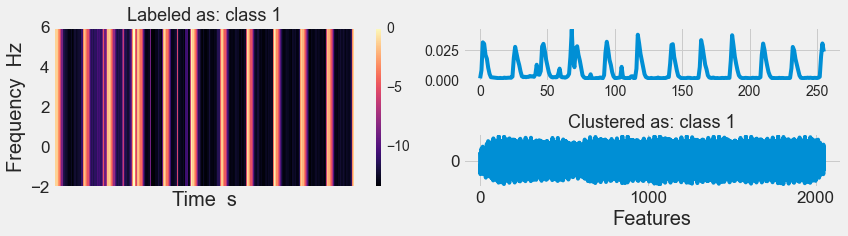

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


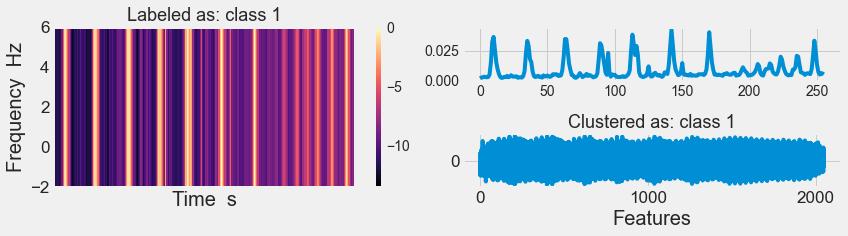

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


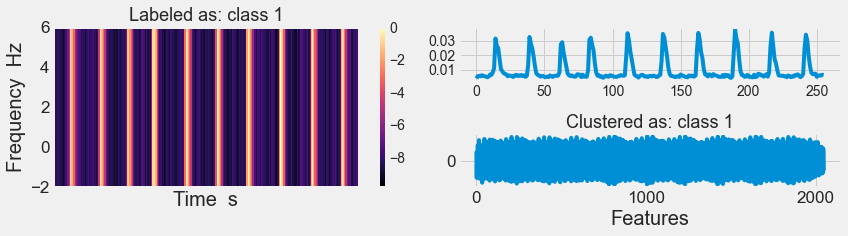

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


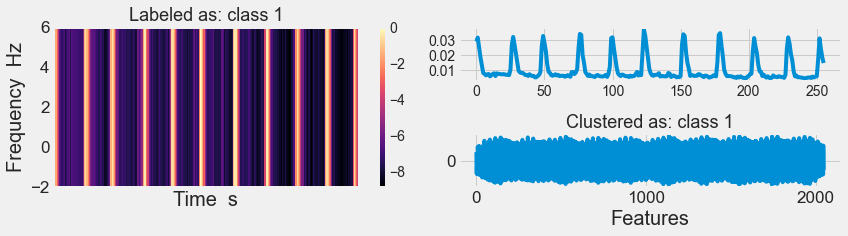

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


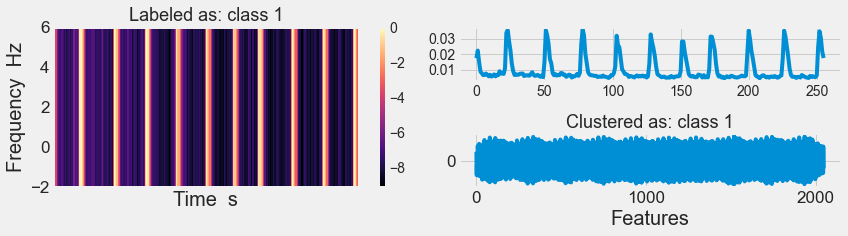

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


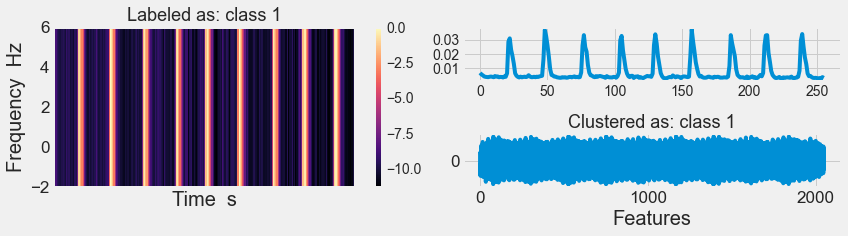

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


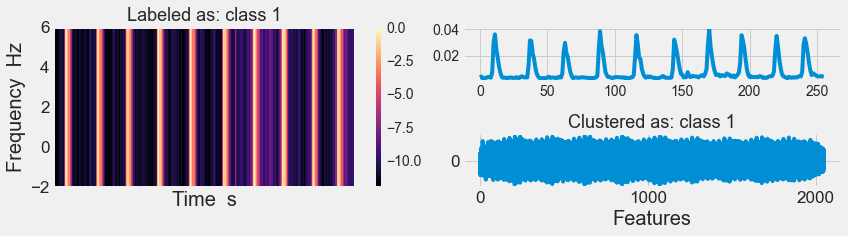

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


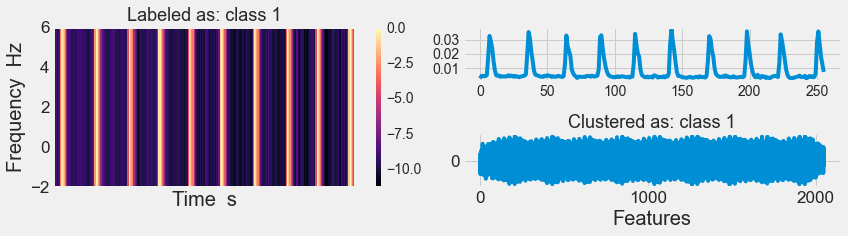

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


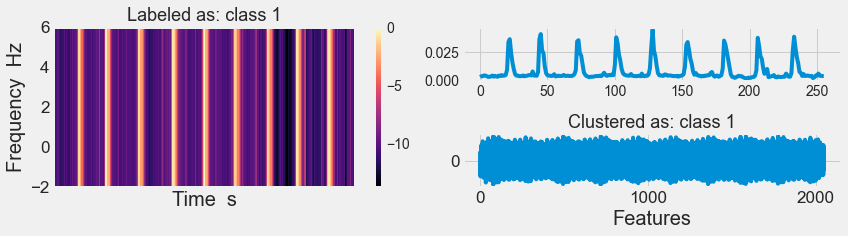

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


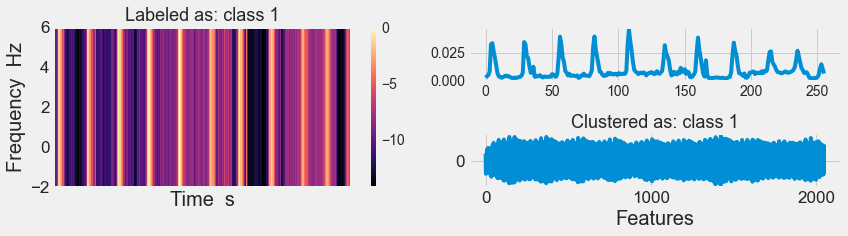

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


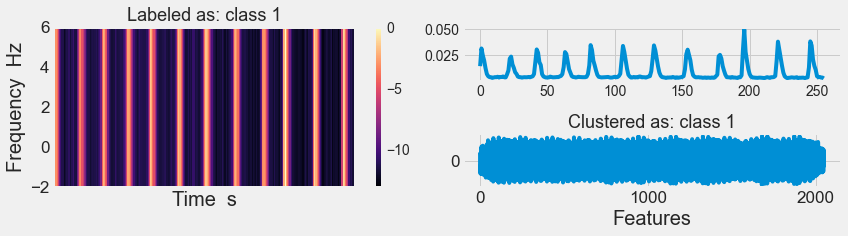

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


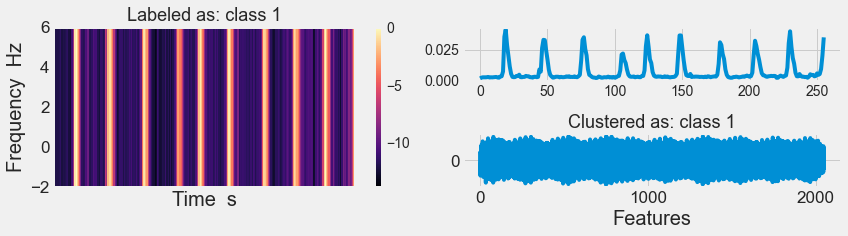

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


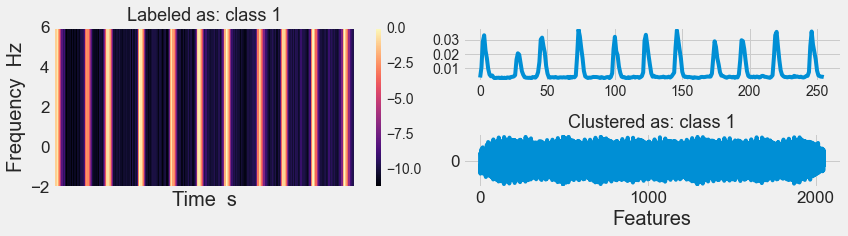

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


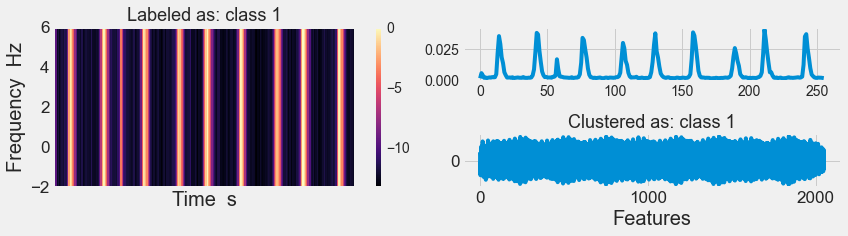

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


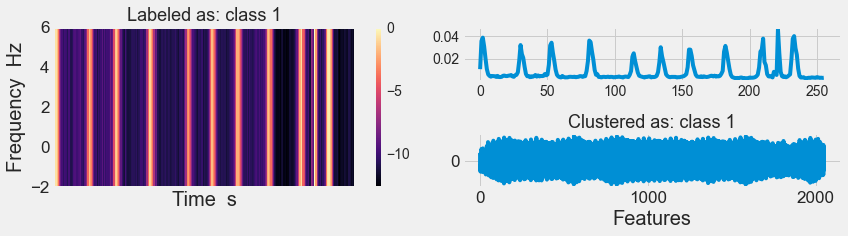

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


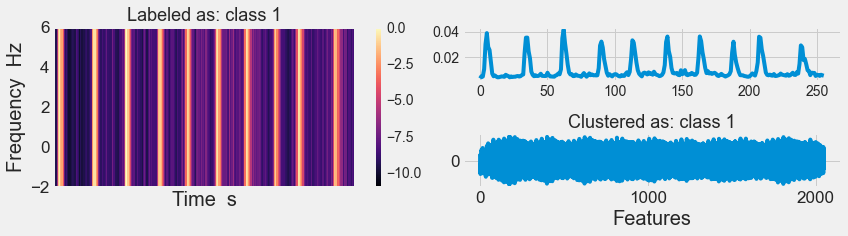

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


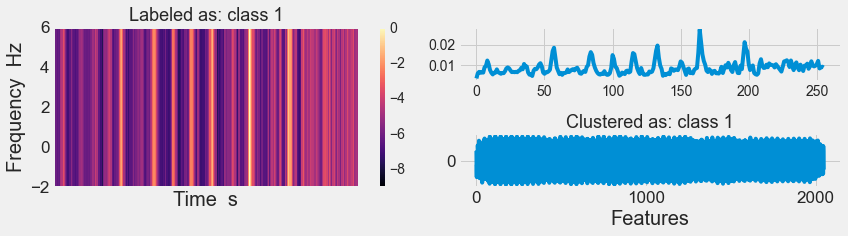

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


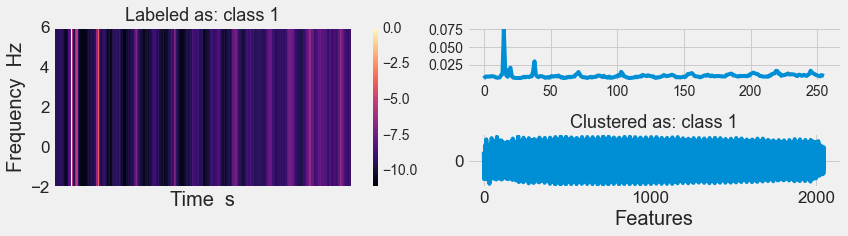

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


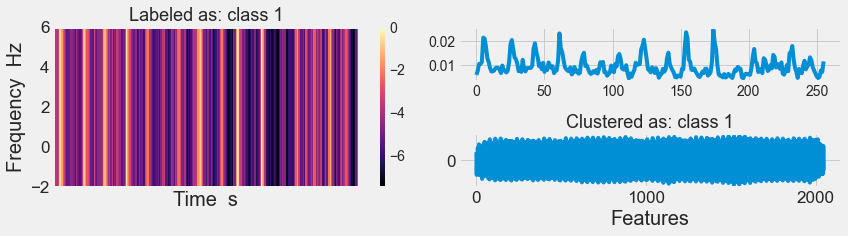

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


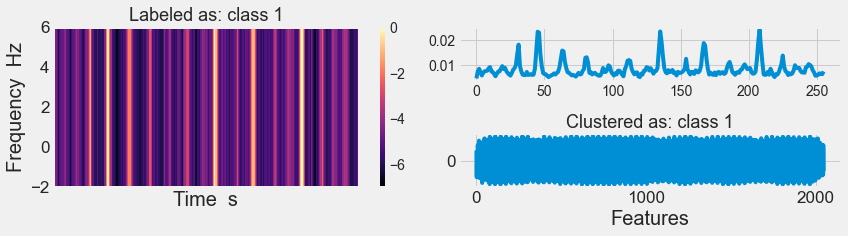

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


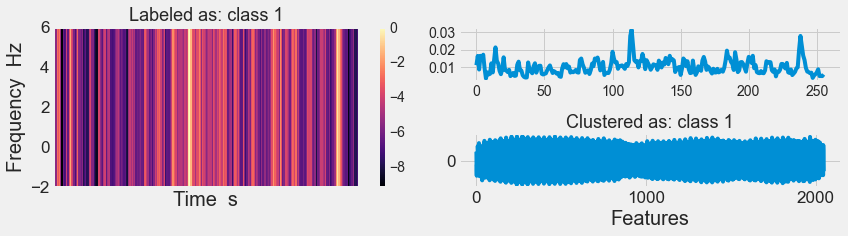

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


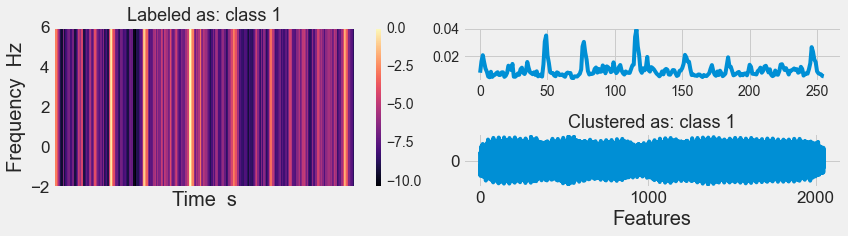

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


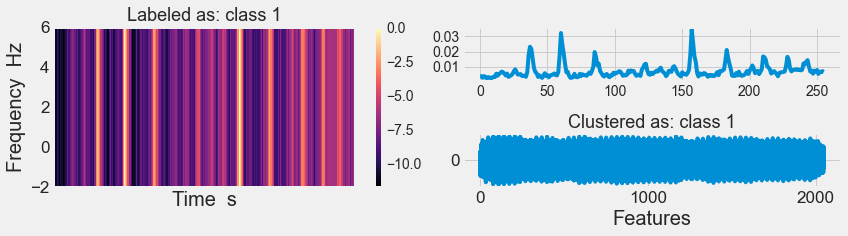

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


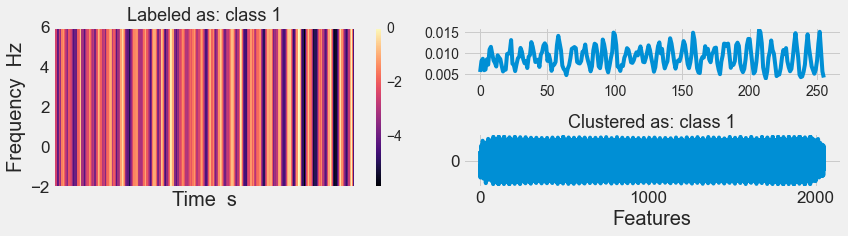

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


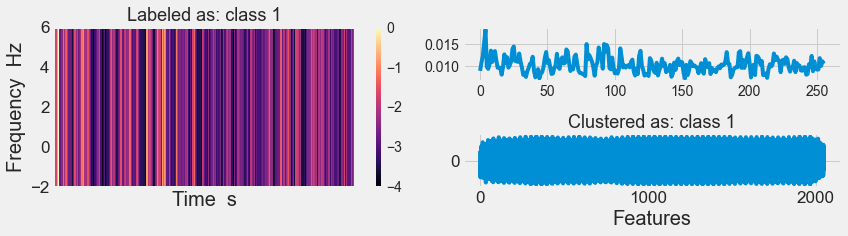

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


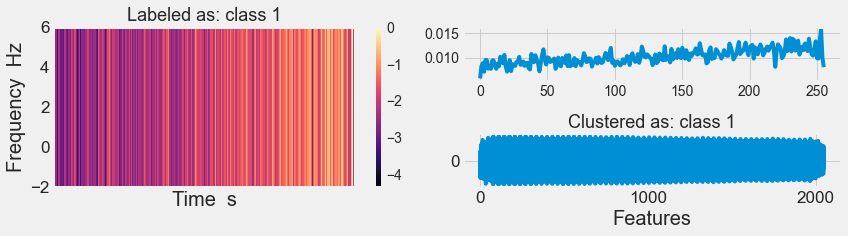

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


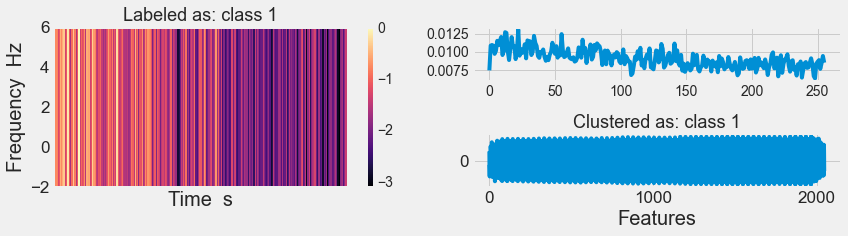

In [95]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5799, 30):    
    
    if y_pred[i] == 1:
        fig = plt.figure(figsize=(12, 3.5))     
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 1', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 2048), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.xlim (0,500)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 1', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

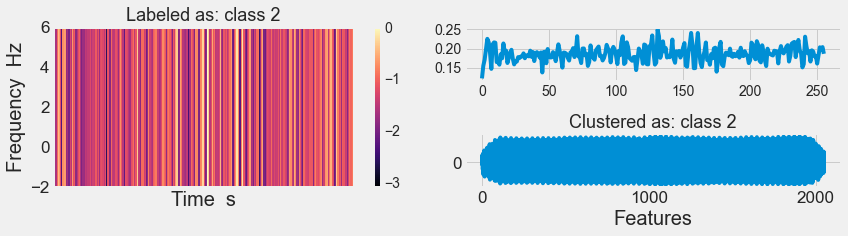

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

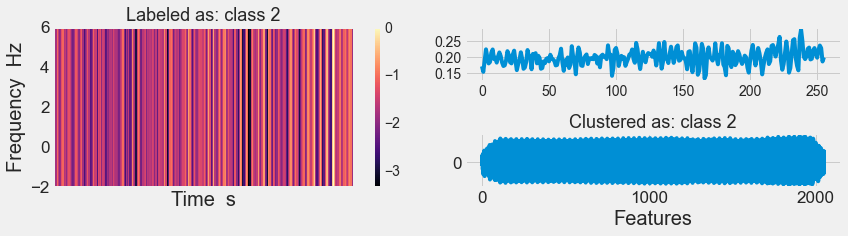

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

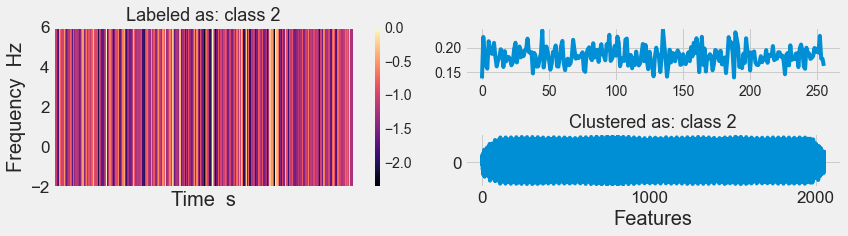

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

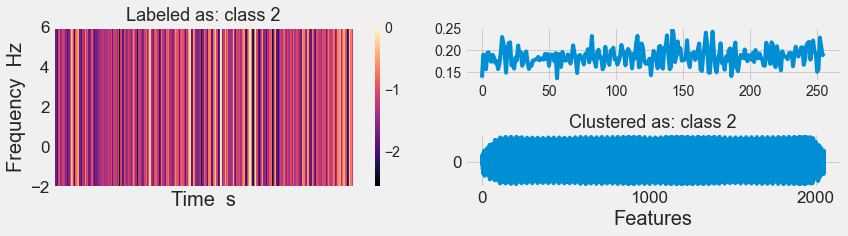

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

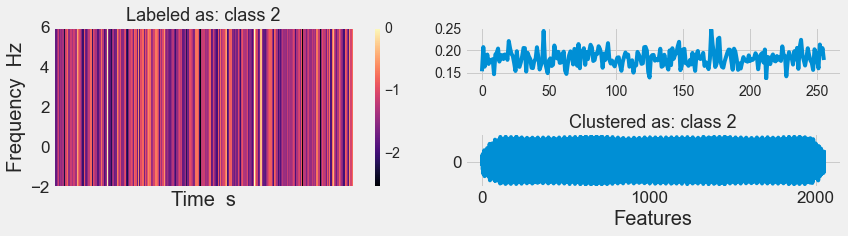

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

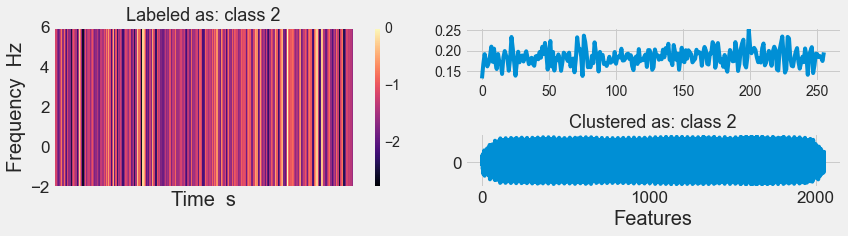

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

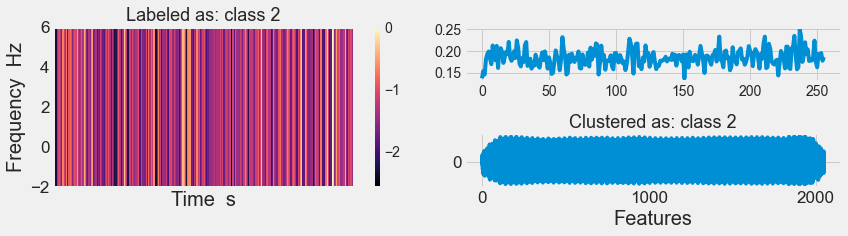

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

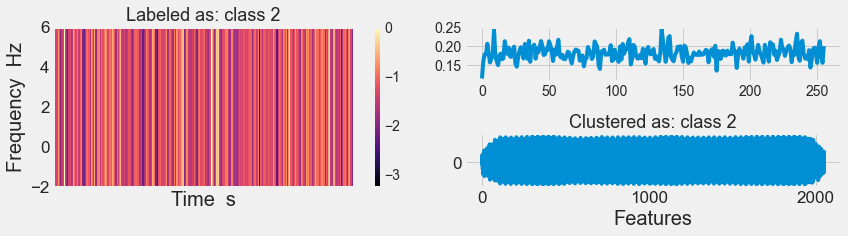

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

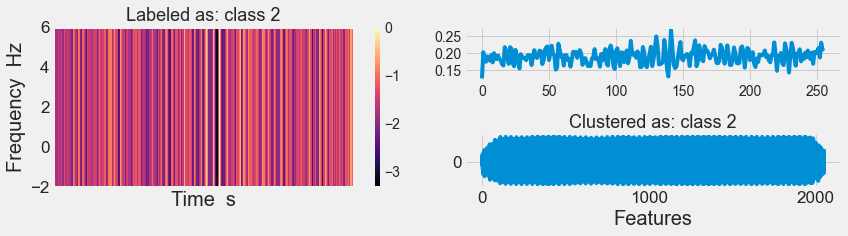

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

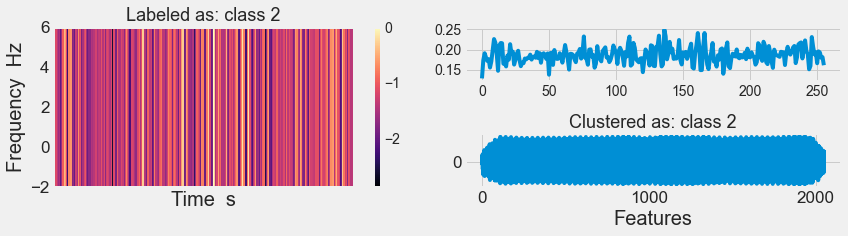

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

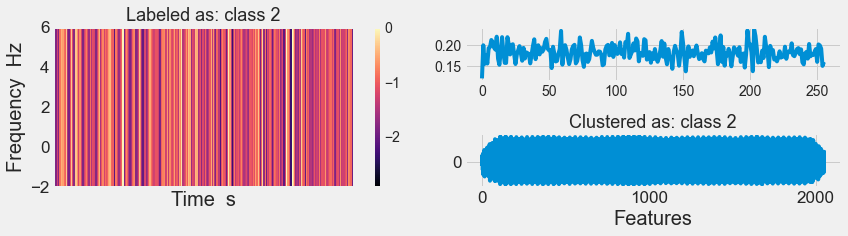

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

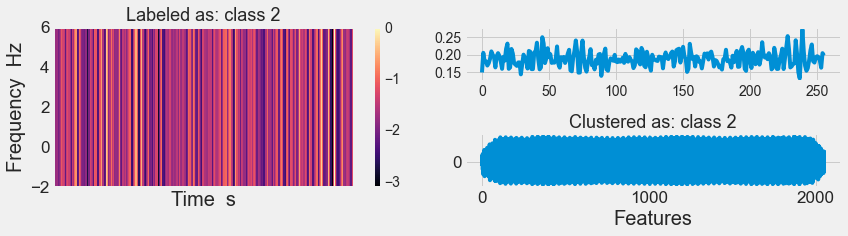

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

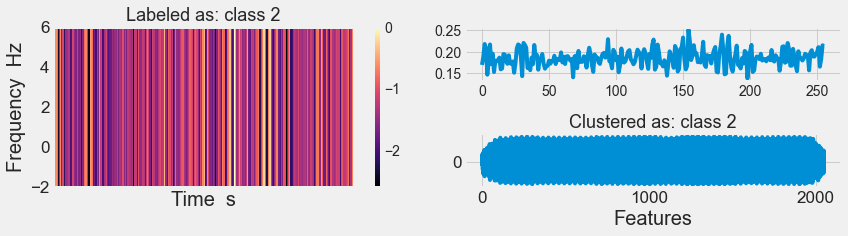

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

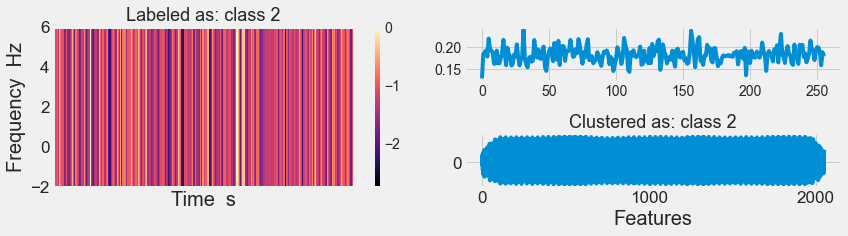

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

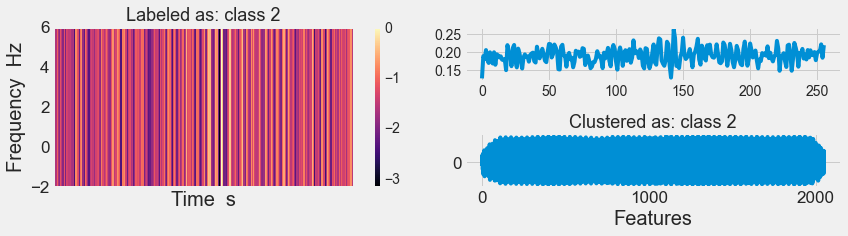

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

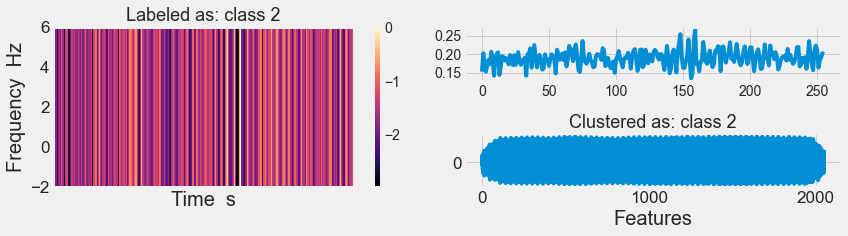

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

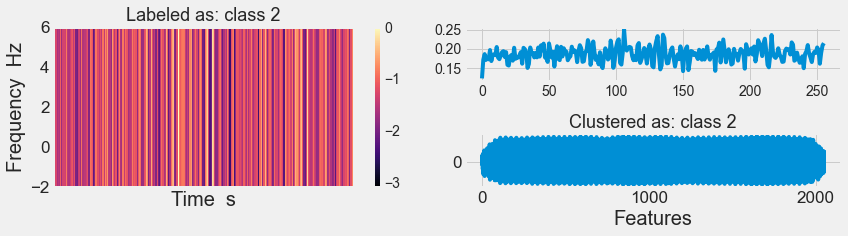

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

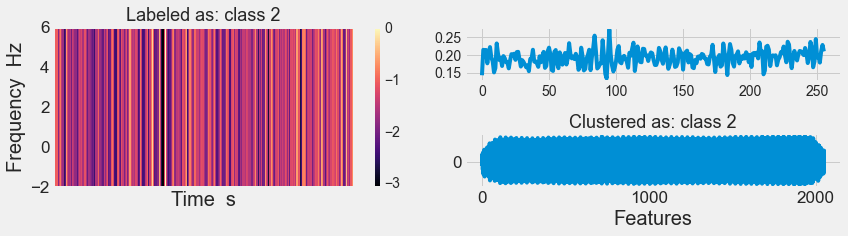

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

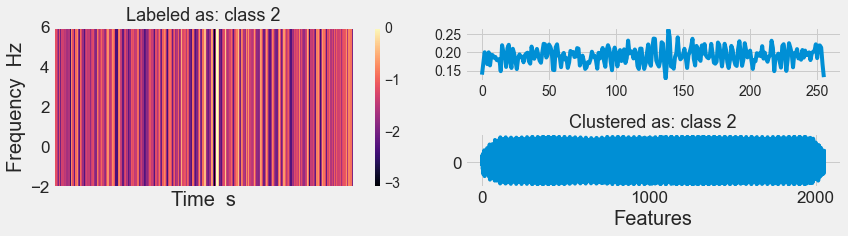

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


<Figure size 864x252 with 0 Axes>

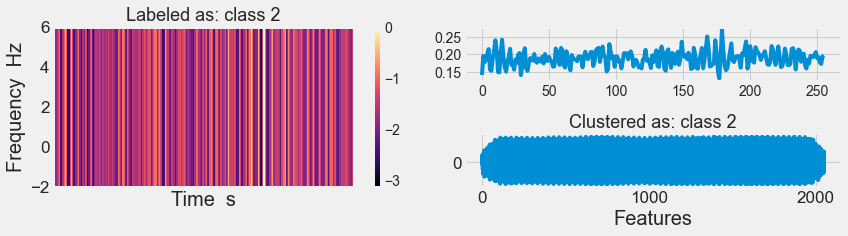

In [85]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5799, 5):    
    
    if y_pred[i] == 2:
        fig = plt.figure(figsize=(12, 3.5))     
        fig = plt.figure(figsize=(12, 3.5))     
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 2', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 2048), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 2', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


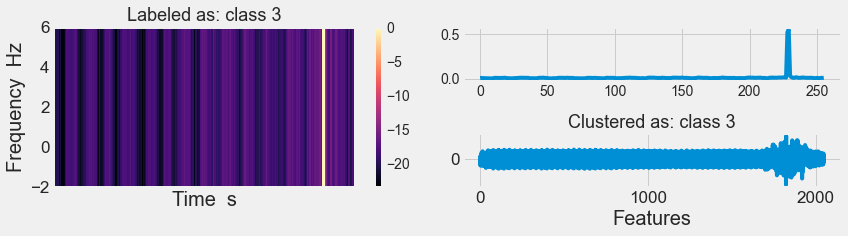

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


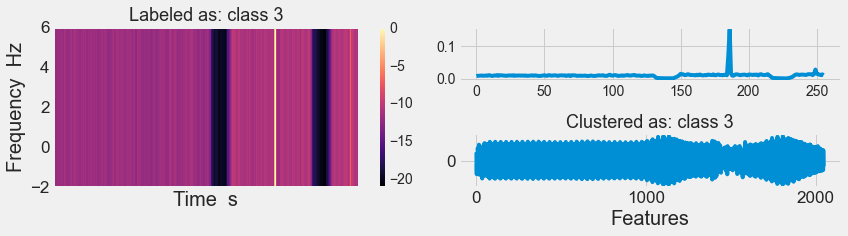

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


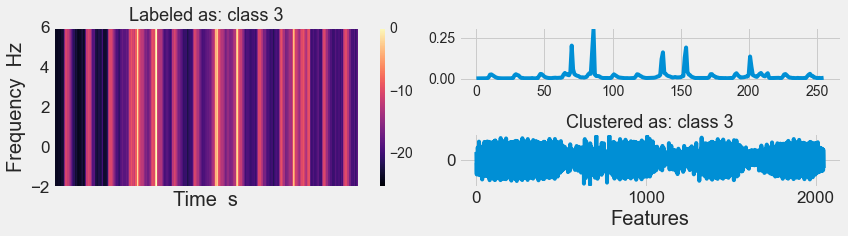

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


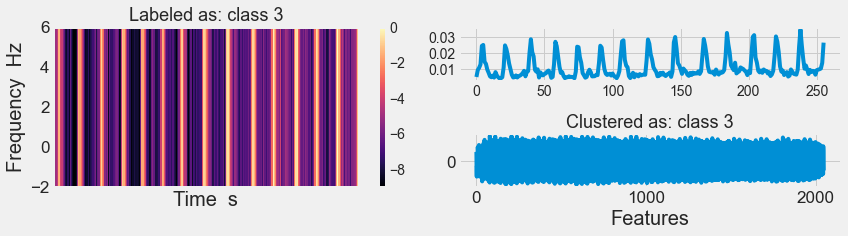

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


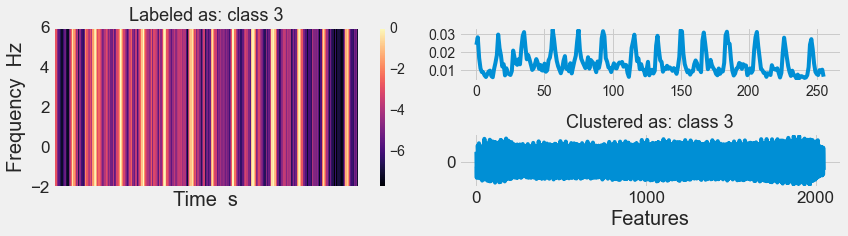

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


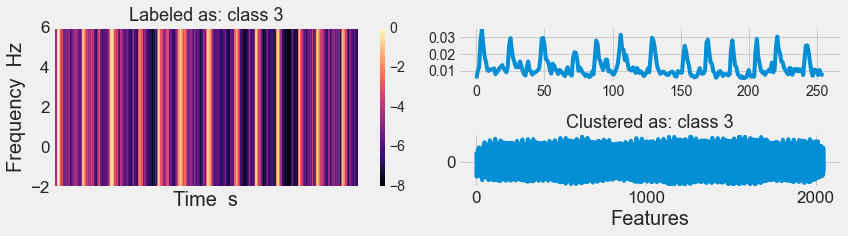

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


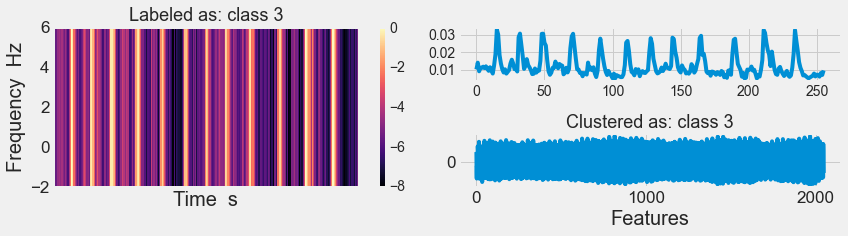

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


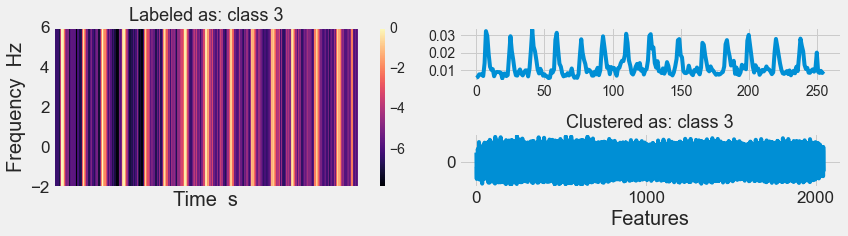

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


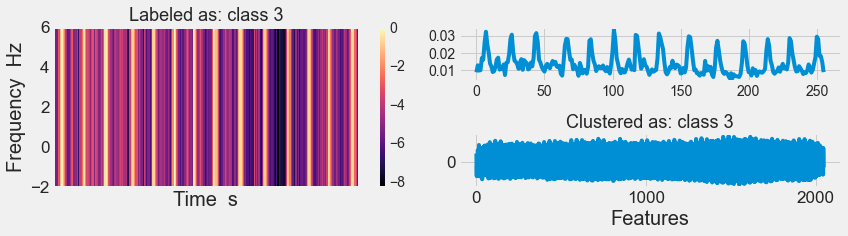

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


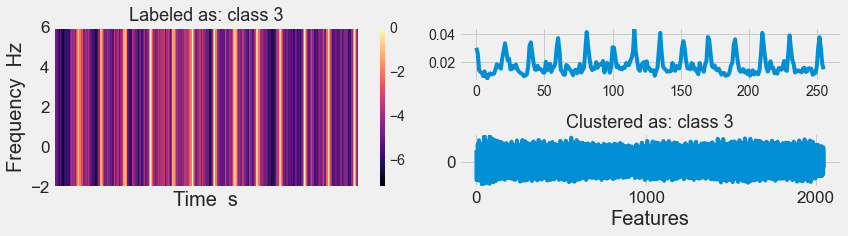

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


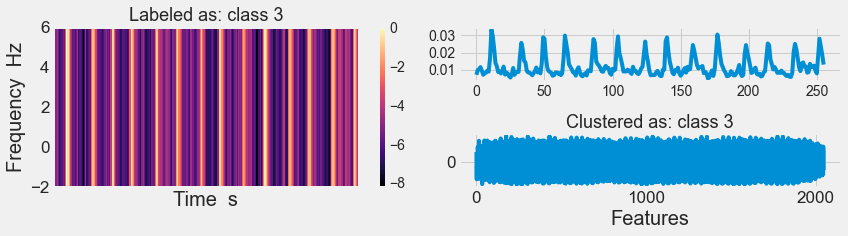

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


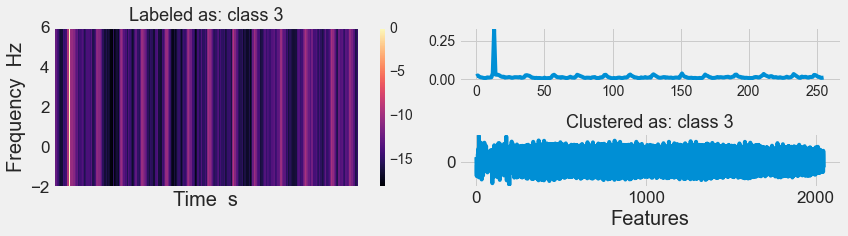

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


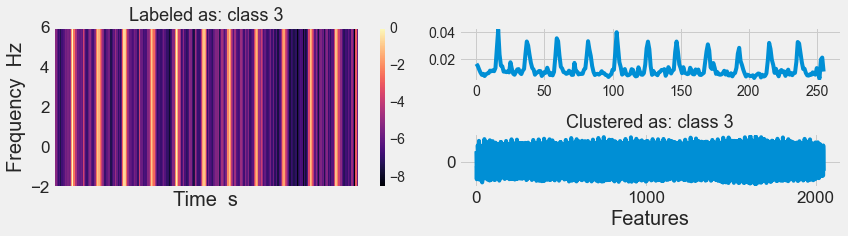

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


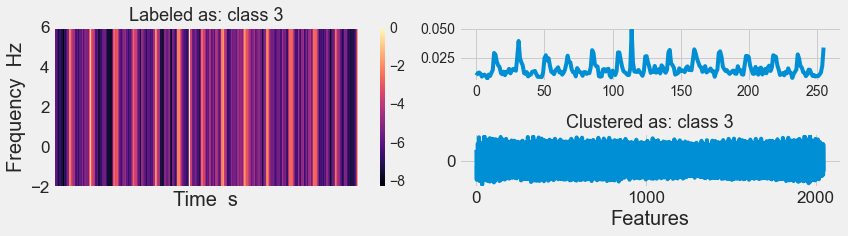

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


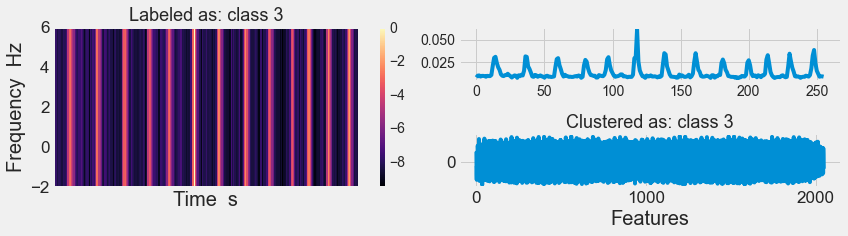

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


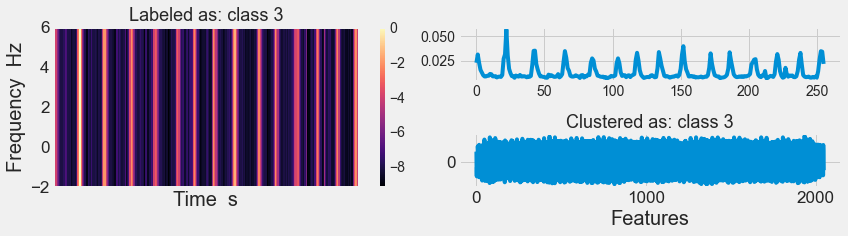

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


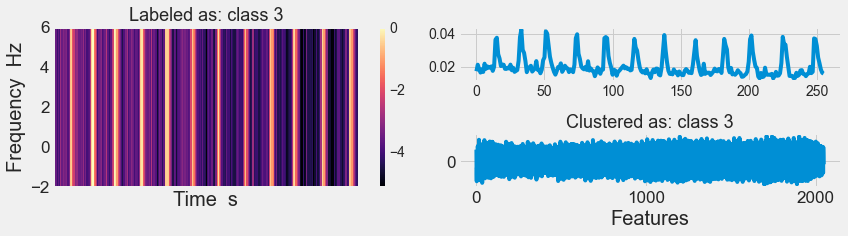

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


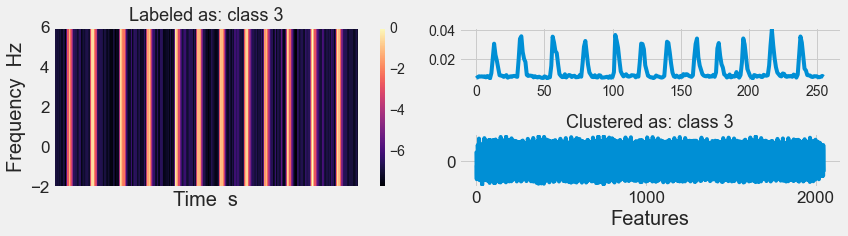

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


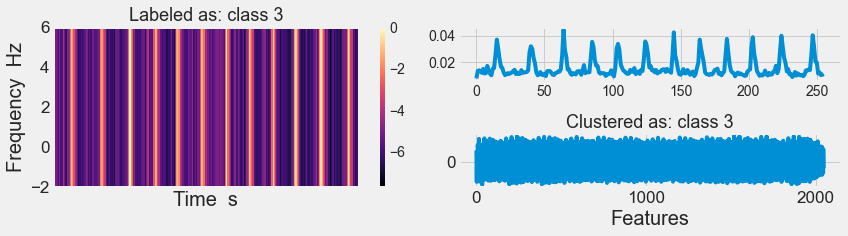

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


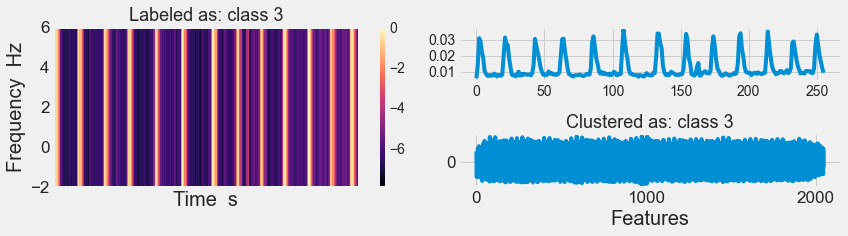

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


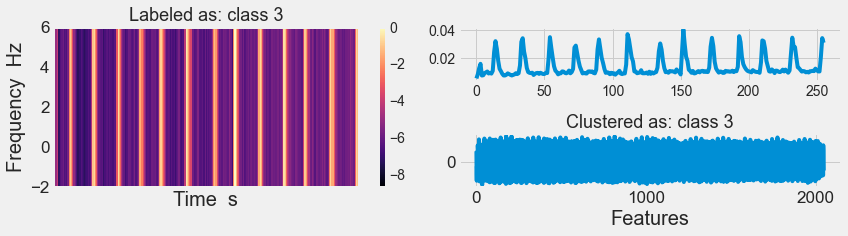

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


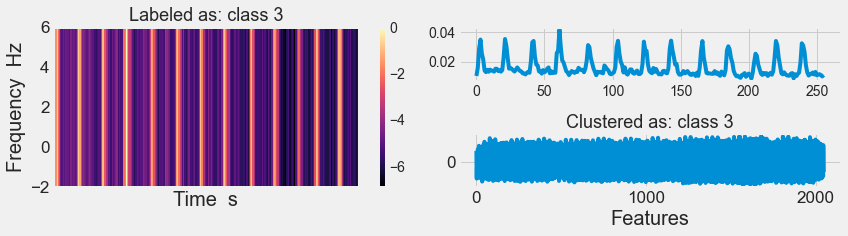

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


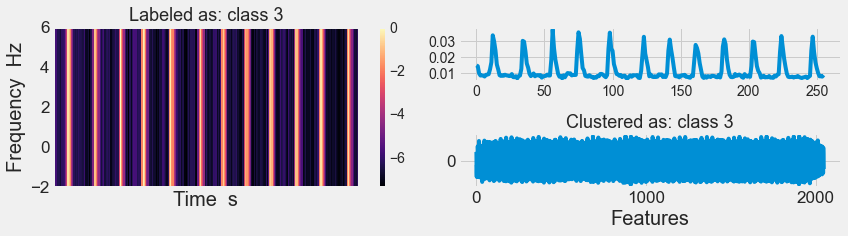

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


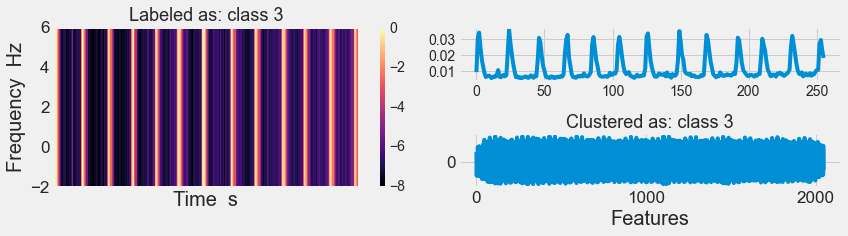

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


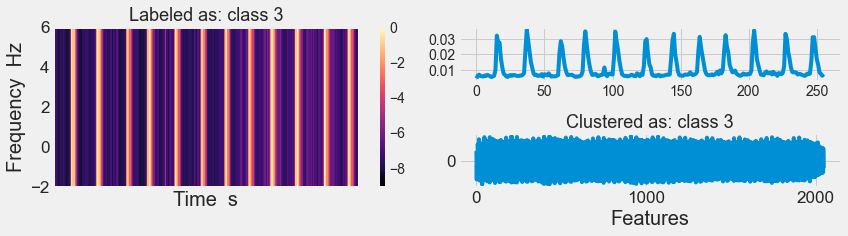

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


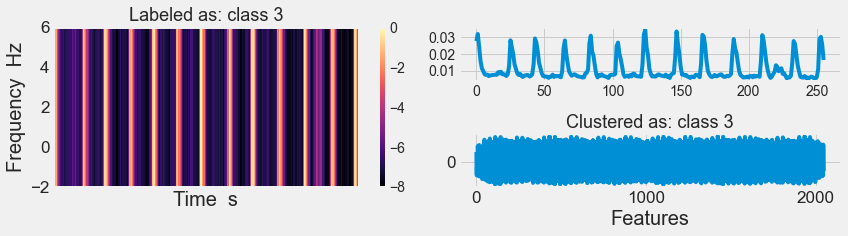

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


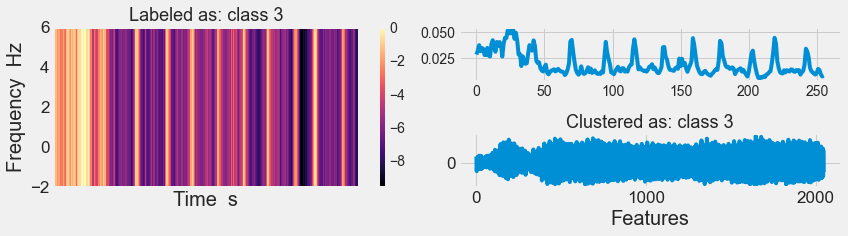

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


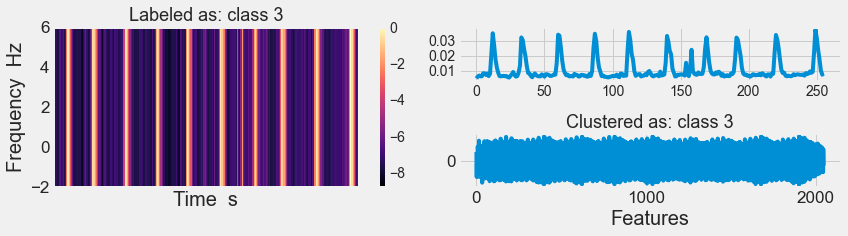

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


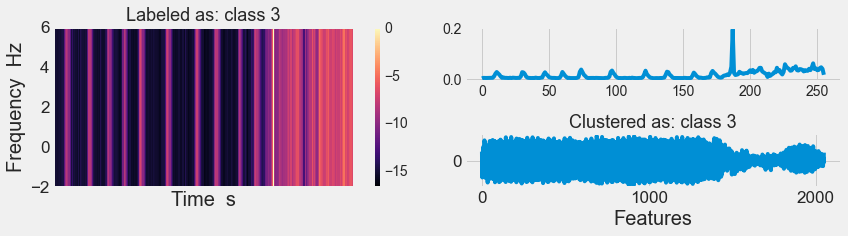

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


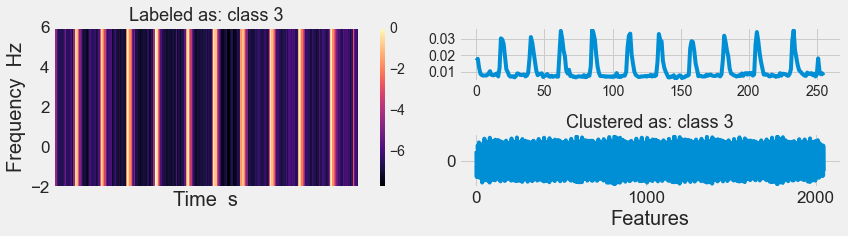

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


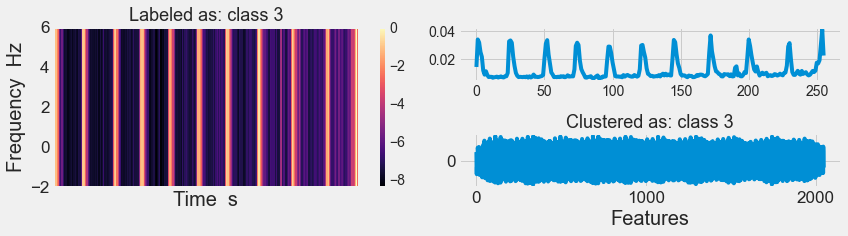

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


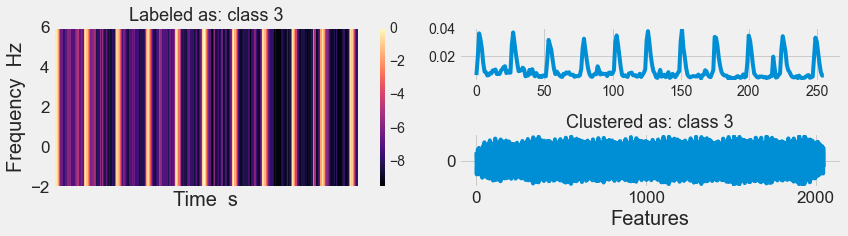

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


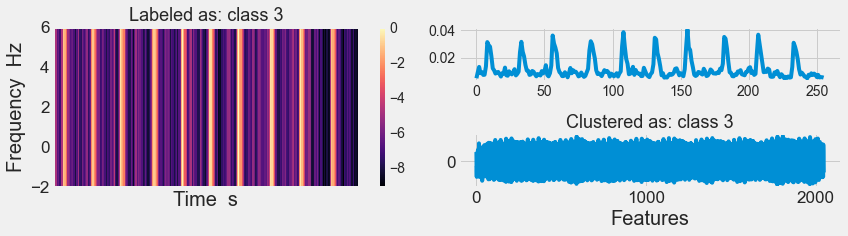

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


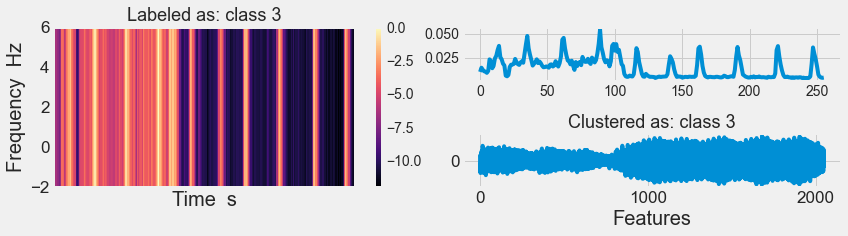

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


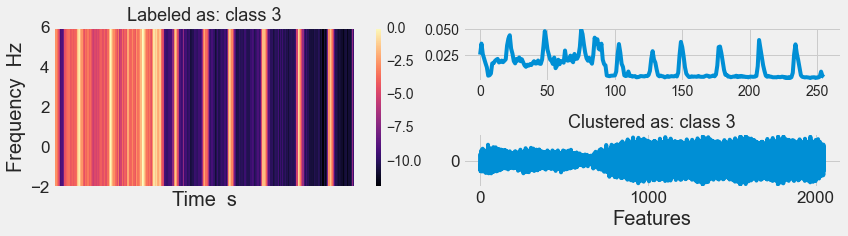

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


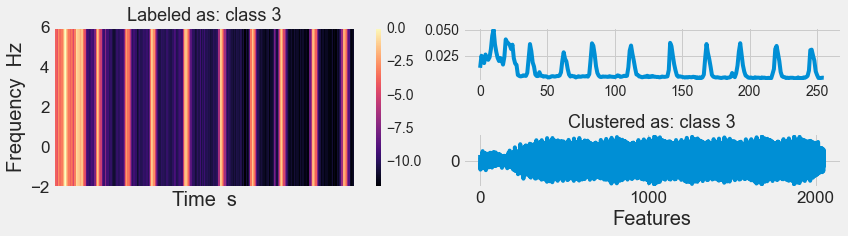

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


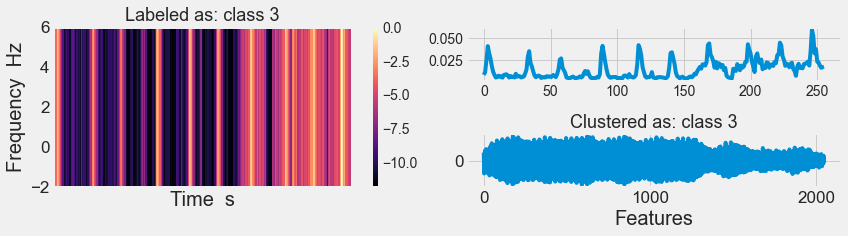

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


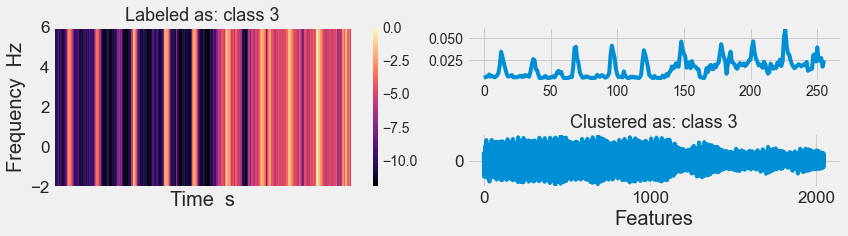

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


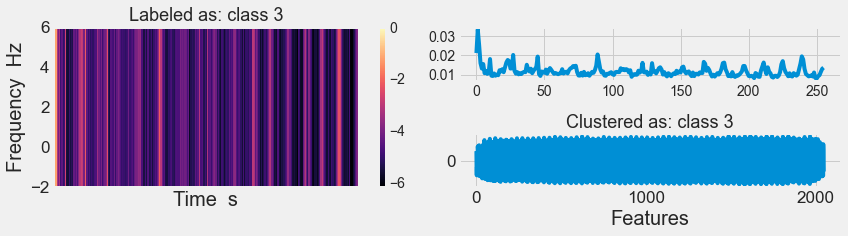

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


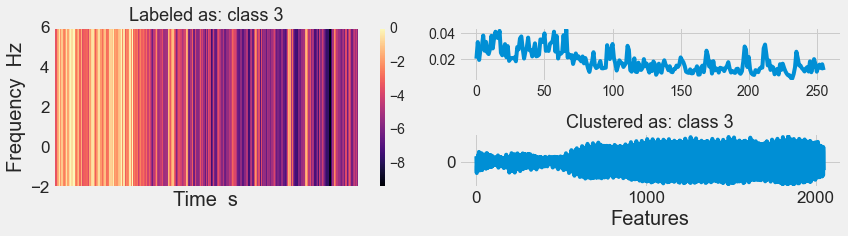

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


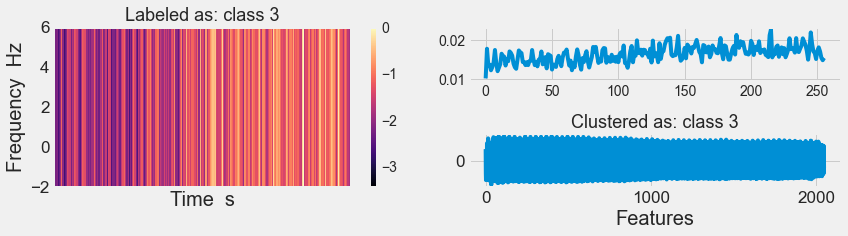

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


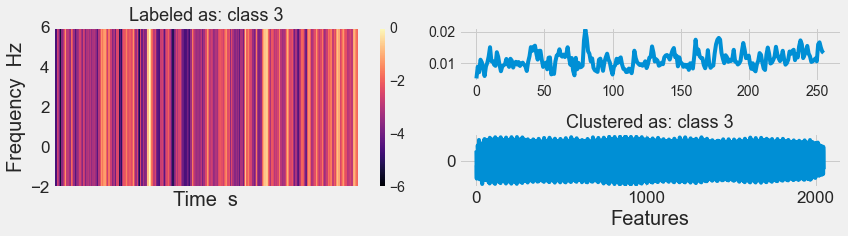

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


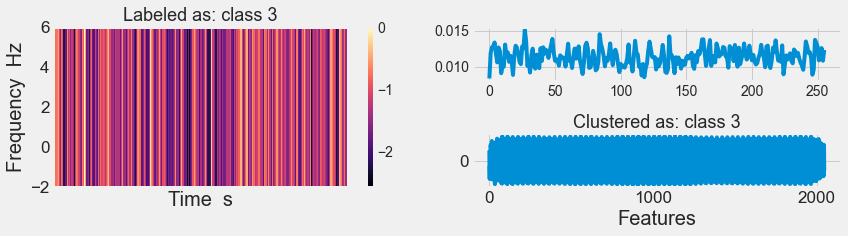

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


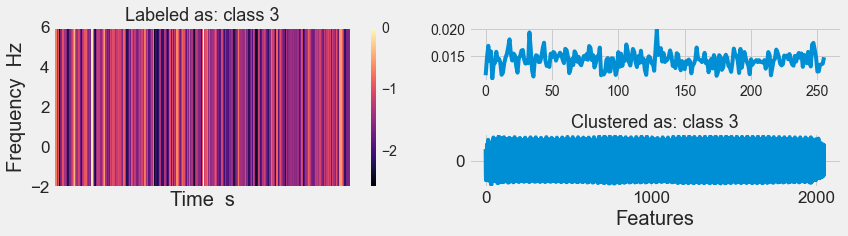

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


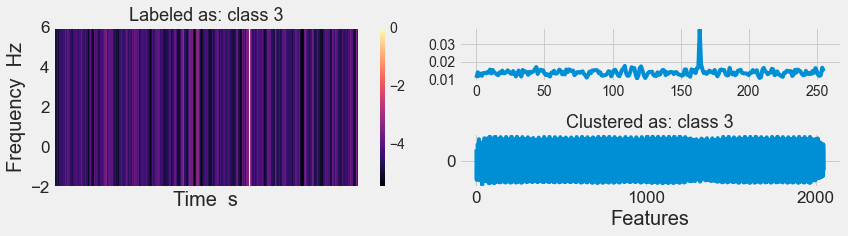

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


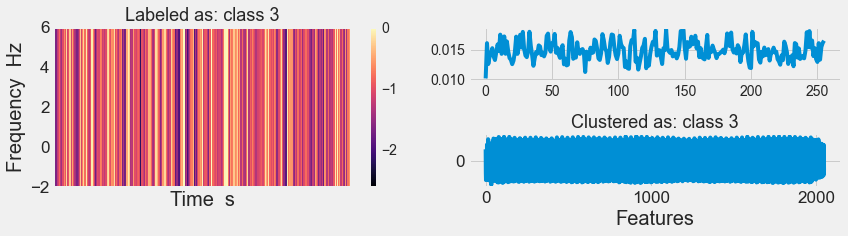

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


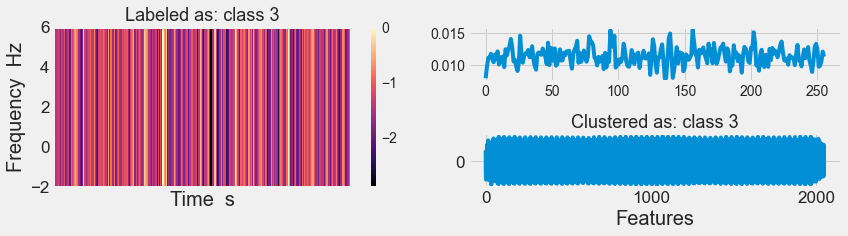

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


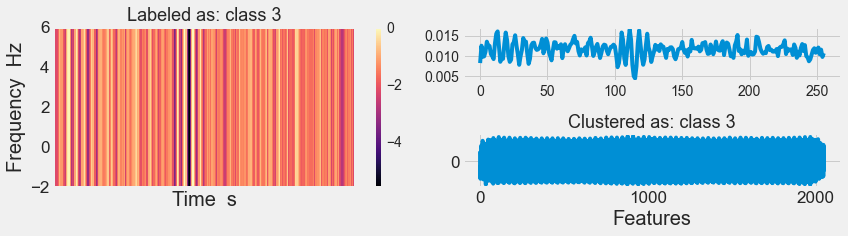

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


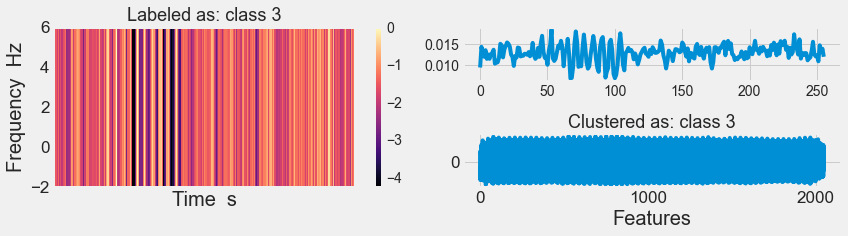

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


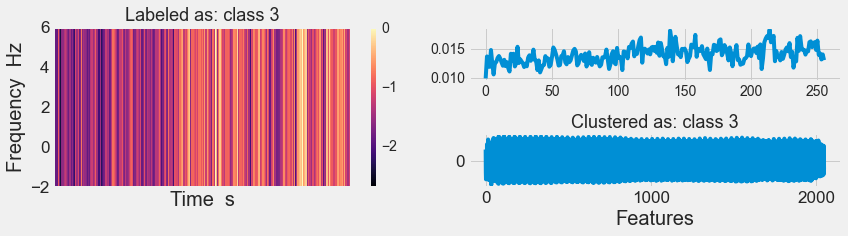

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


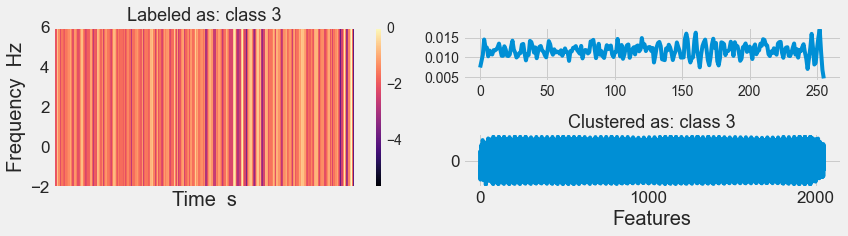

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


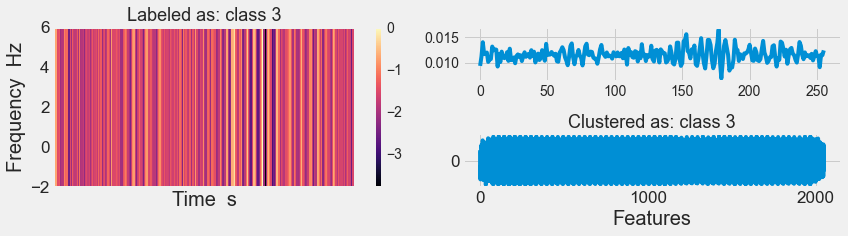

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


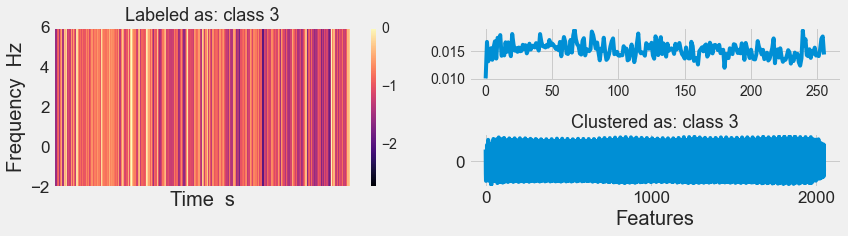

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


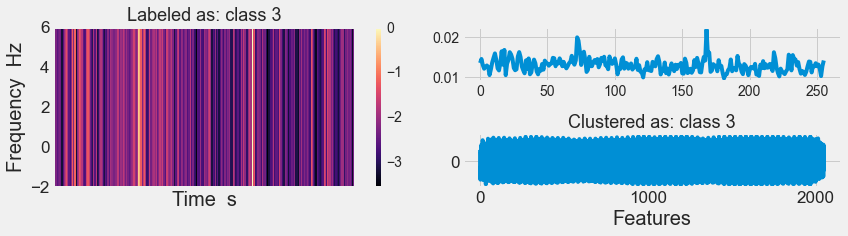

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


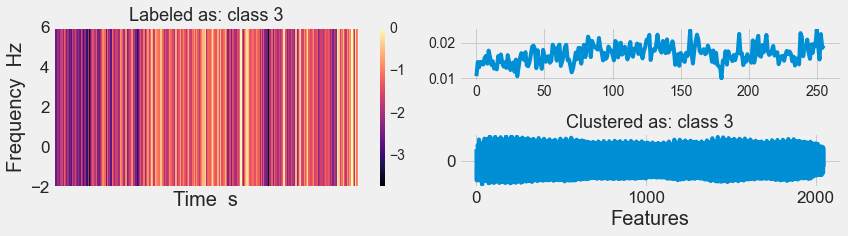

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


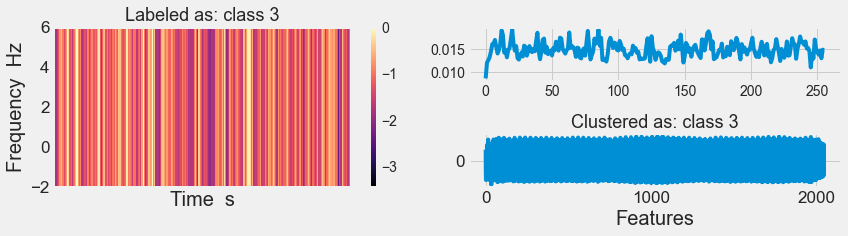

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


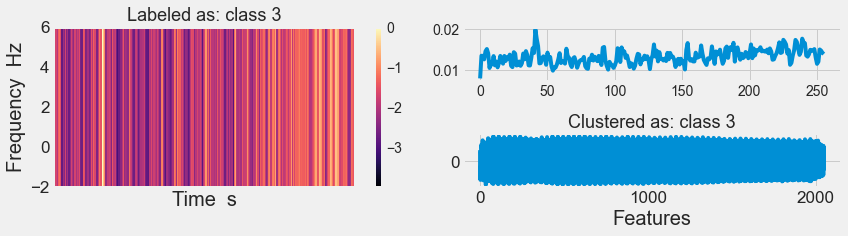

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


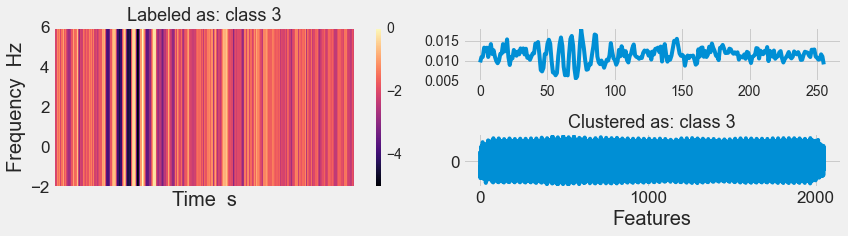

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


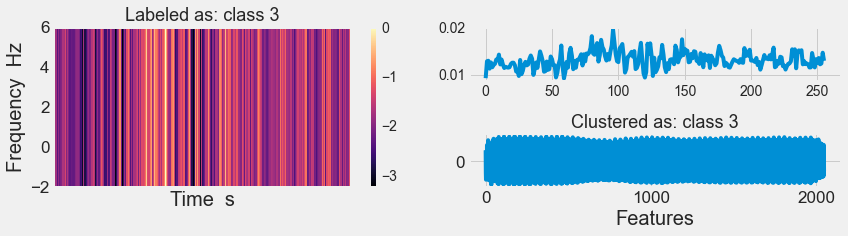

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


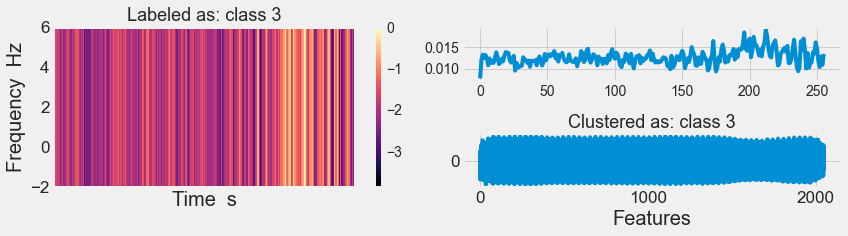

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


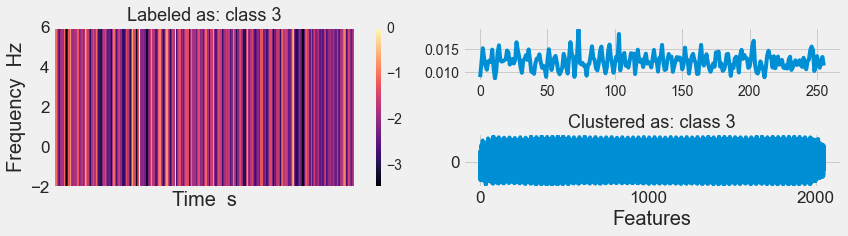

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


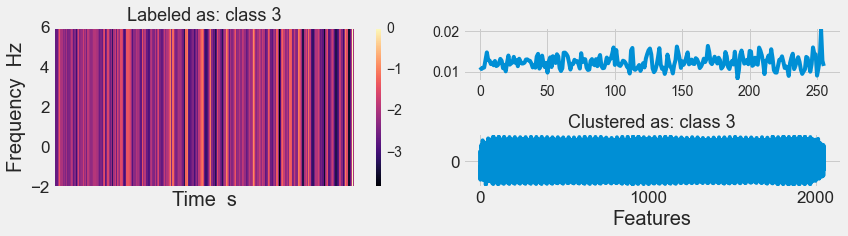

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


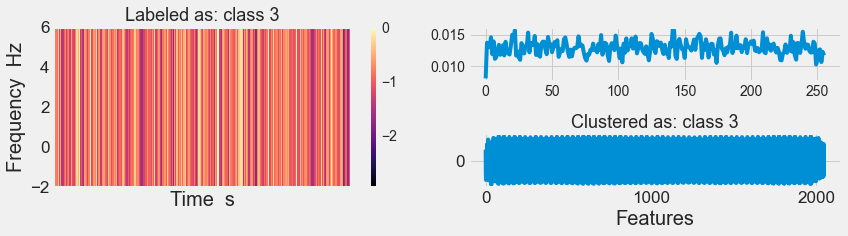

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


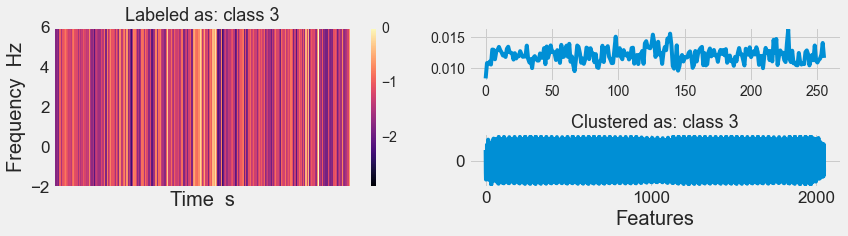

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


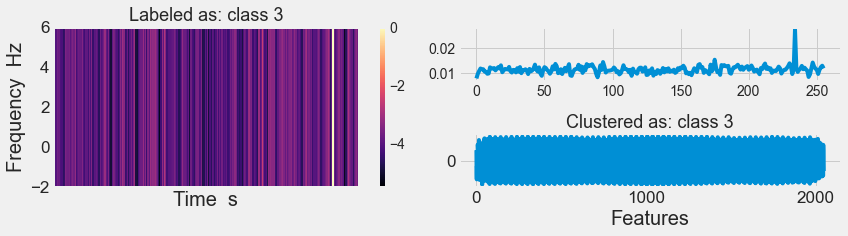

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


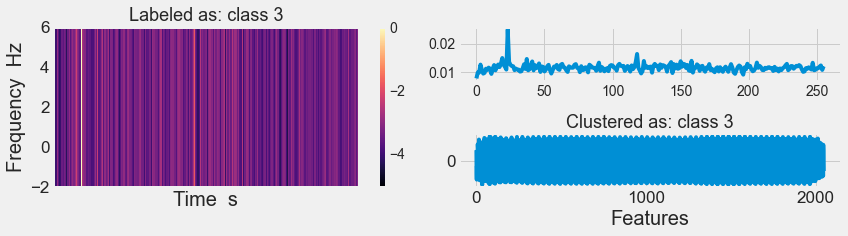

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


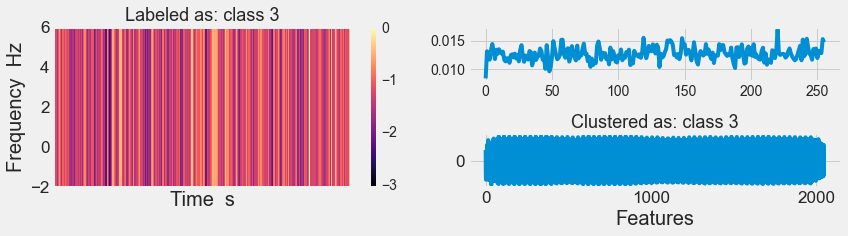

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


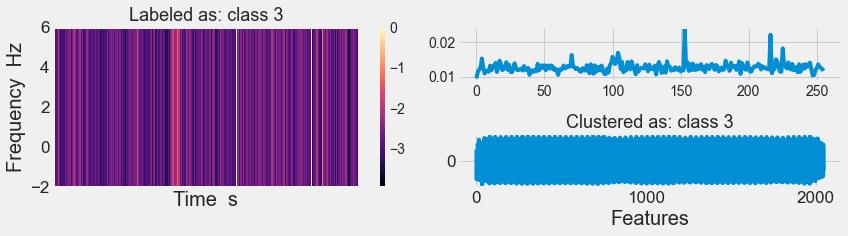

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


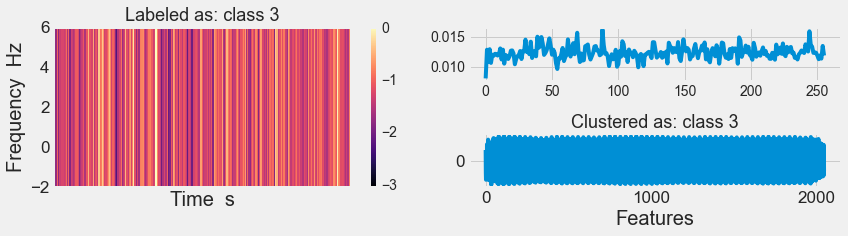

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


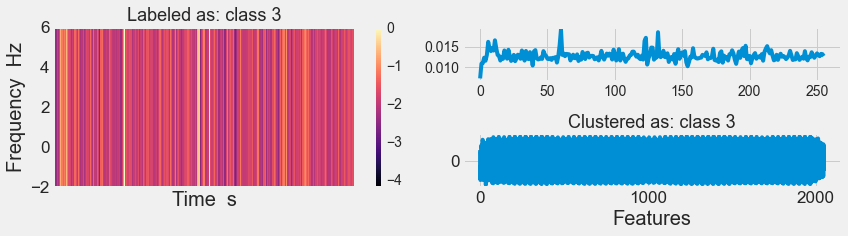

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


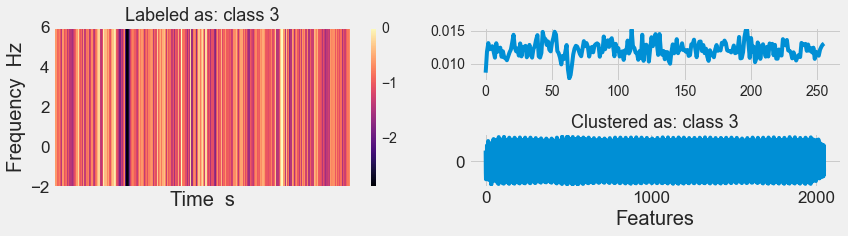

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


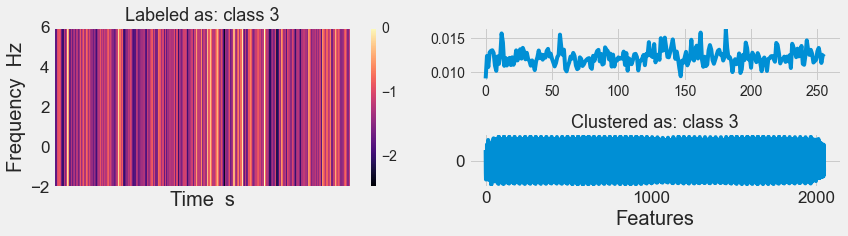

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


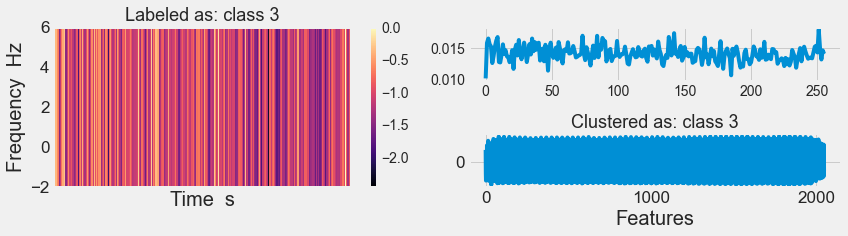

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


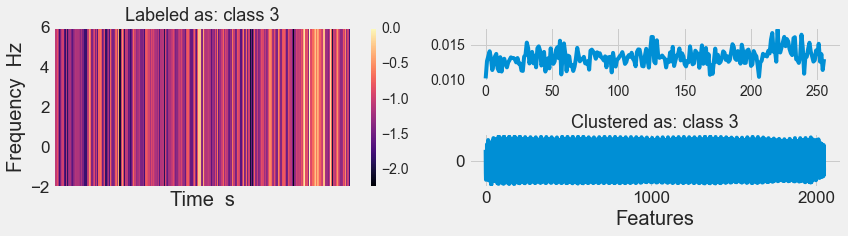

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


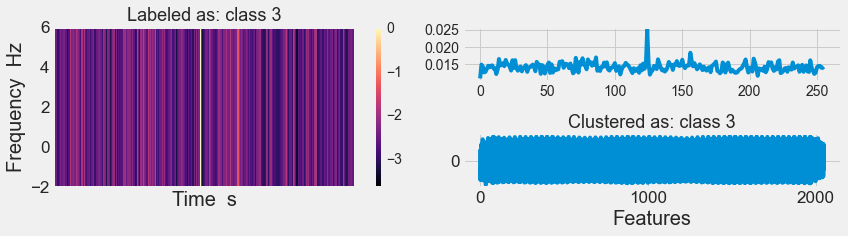

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


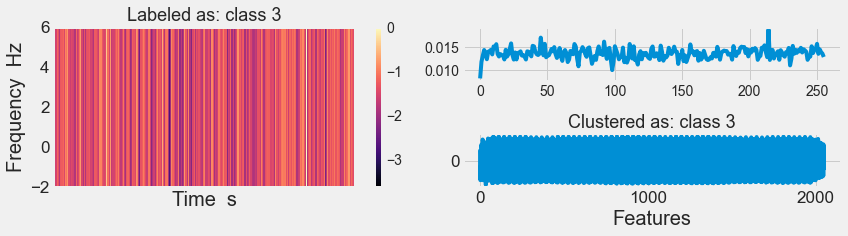

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


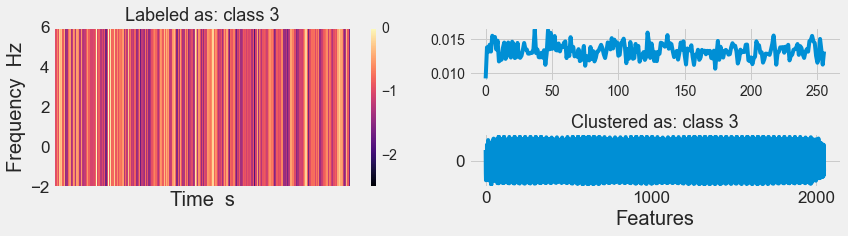

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


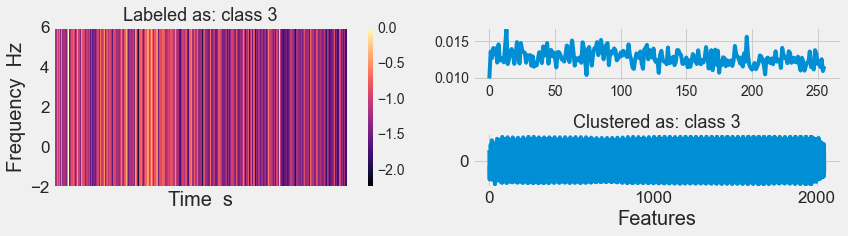

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


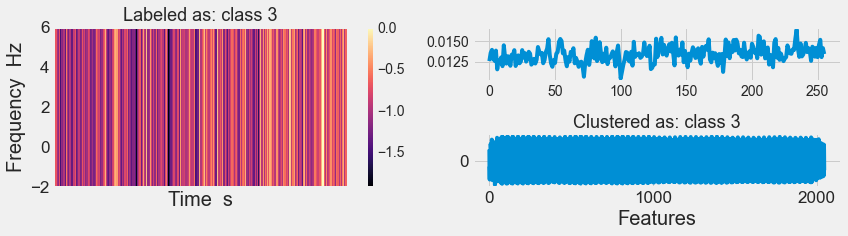

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


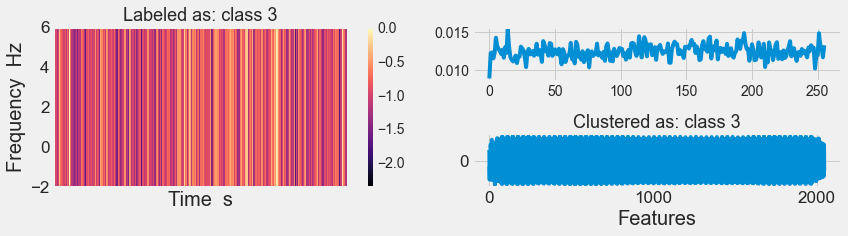

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


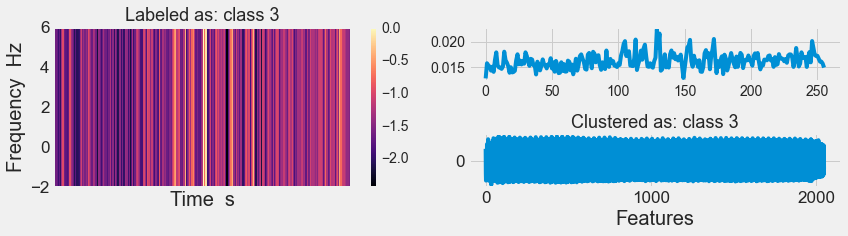

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


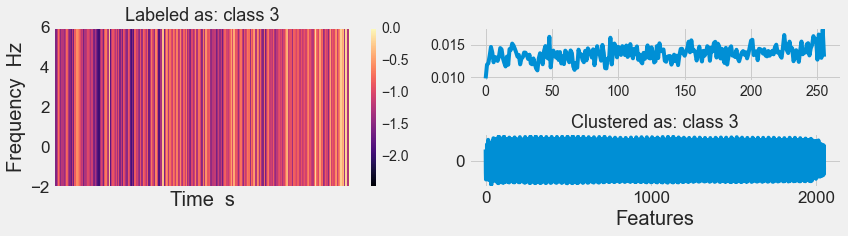

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


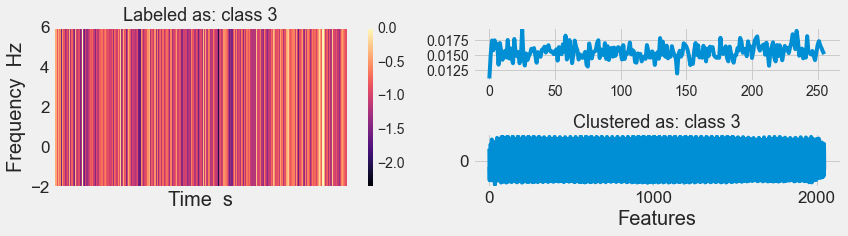

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


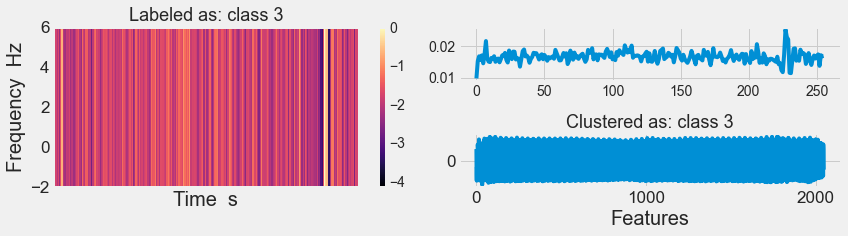

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


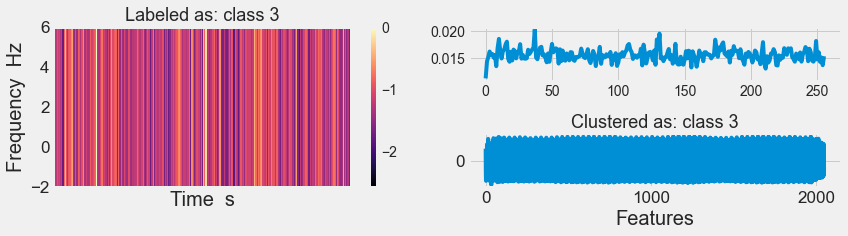

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


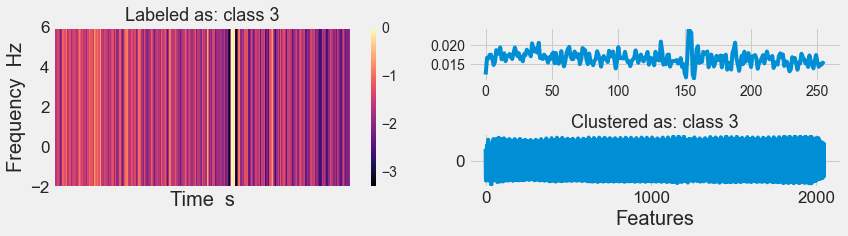

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


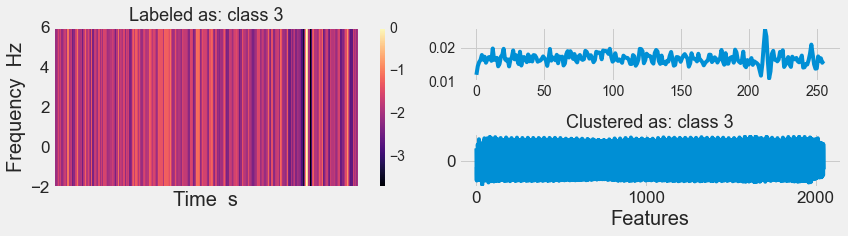

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


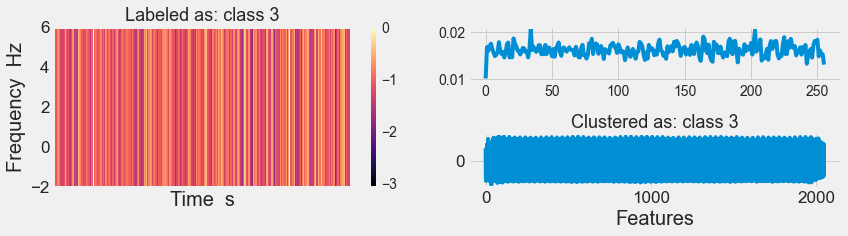

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


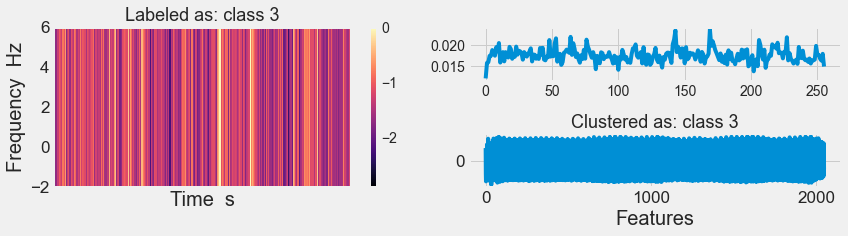

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


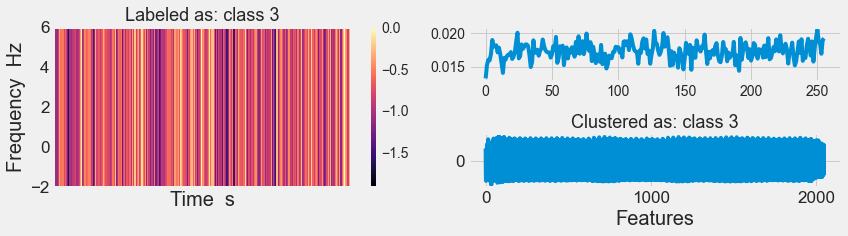

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


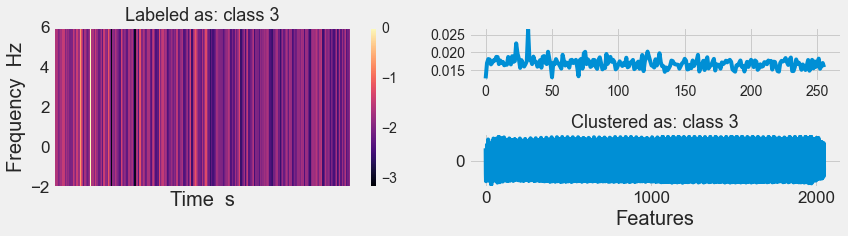

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


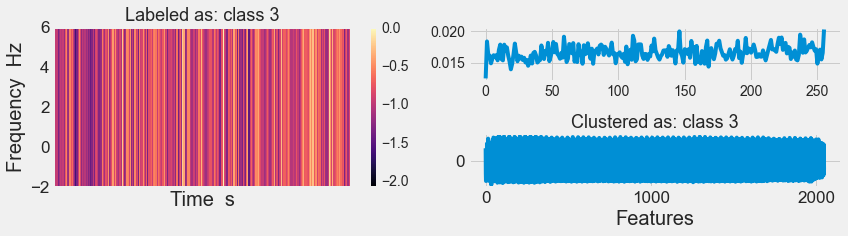

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


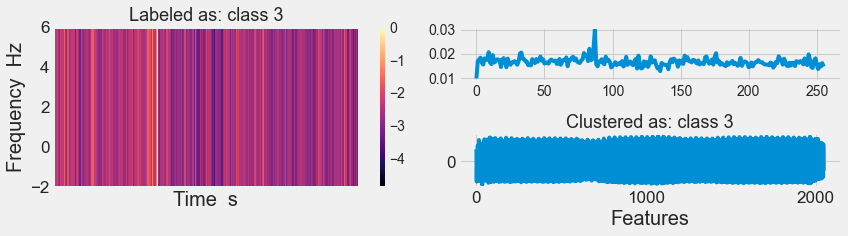

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


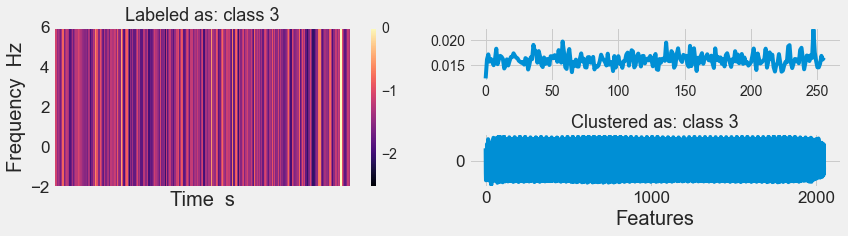

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


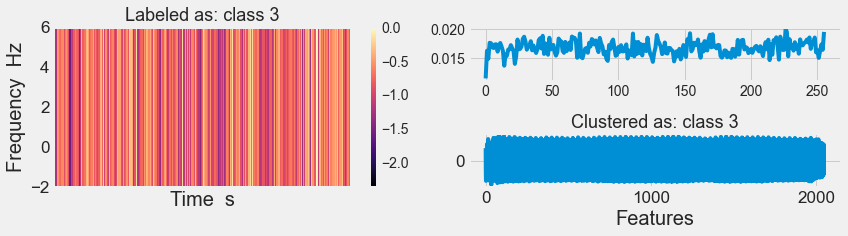

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


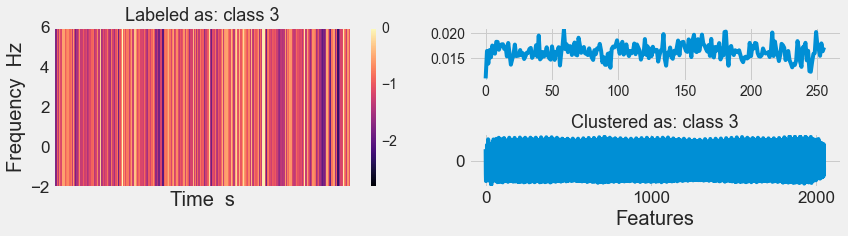

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


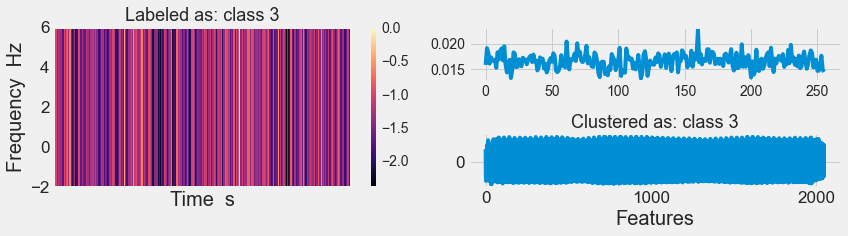

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


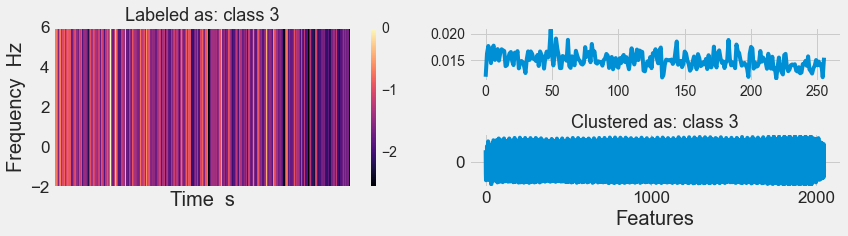

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


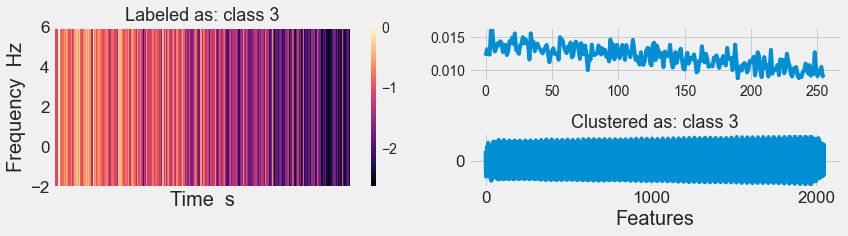

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


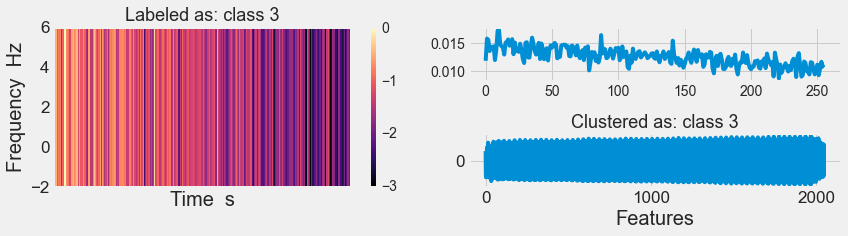

In [86]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5800, 20):    
    
    if y_pred[i] == 3:
        fig = plt.figure(figsize=(12, 3.5))     
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 3', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 64), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 3', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


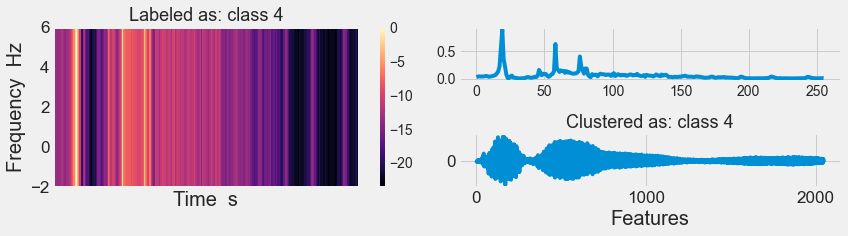

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


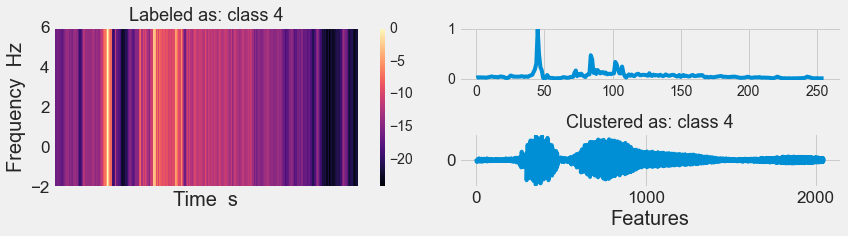

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


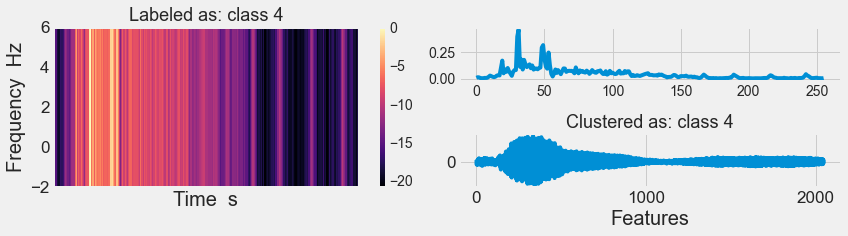

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


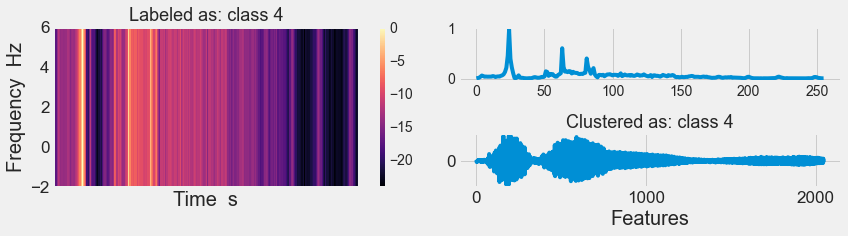

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


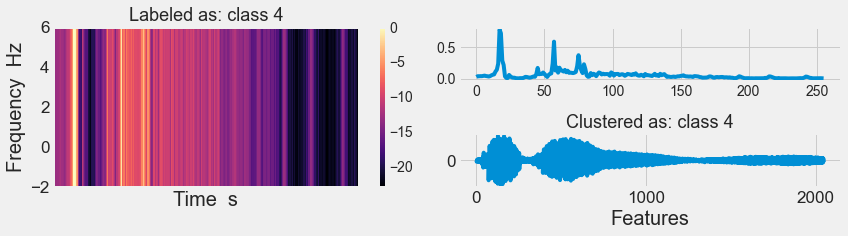

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


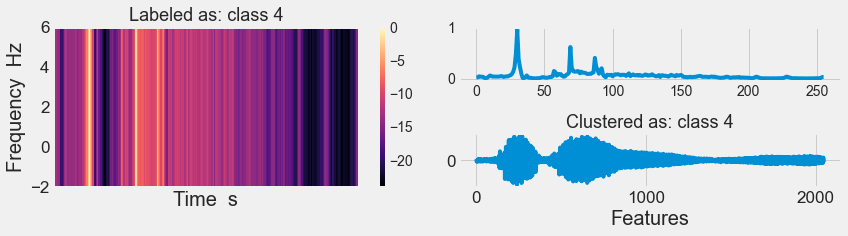

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


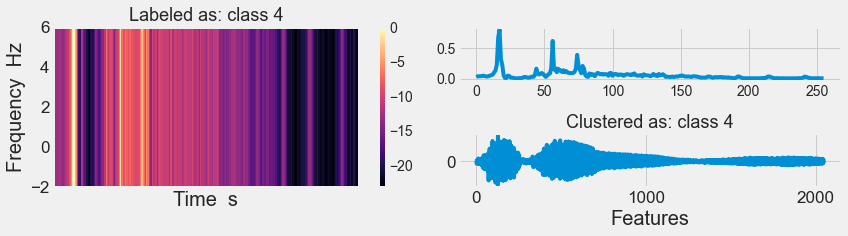

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


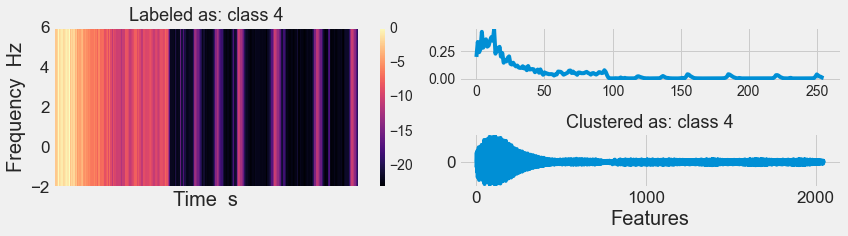

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


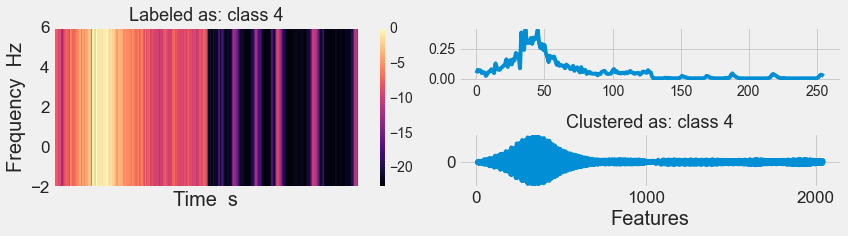

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


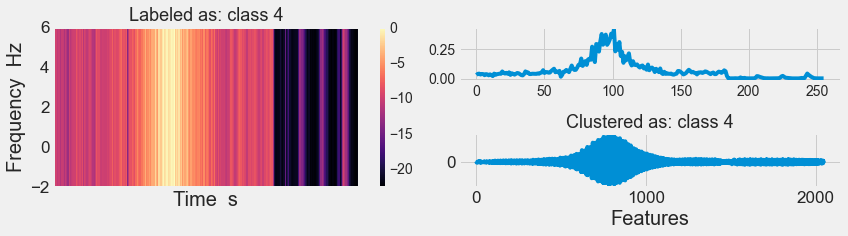

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


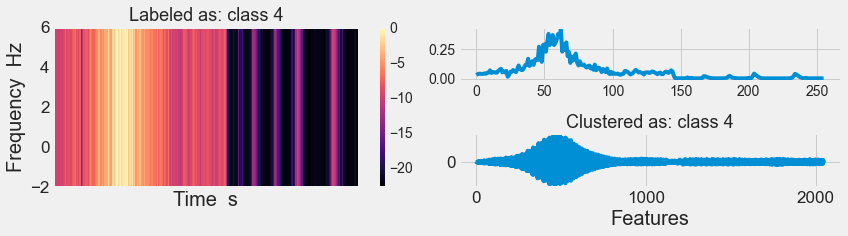

In [87]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5799, 1):    
    
    if y_pred[i] == 4:
        fig = plt.figure(figsize=(12, 3.5))     
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 4', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 2048), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 4', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


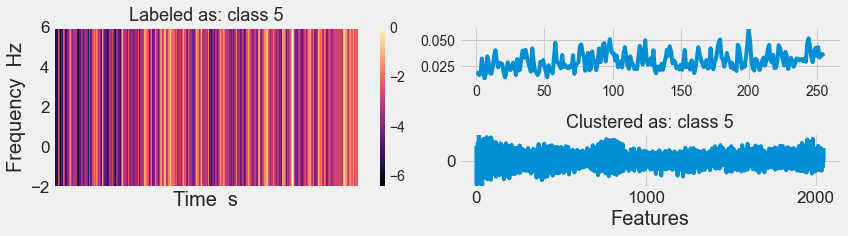

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


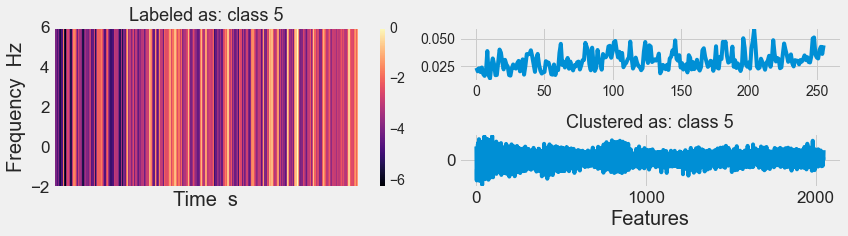

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


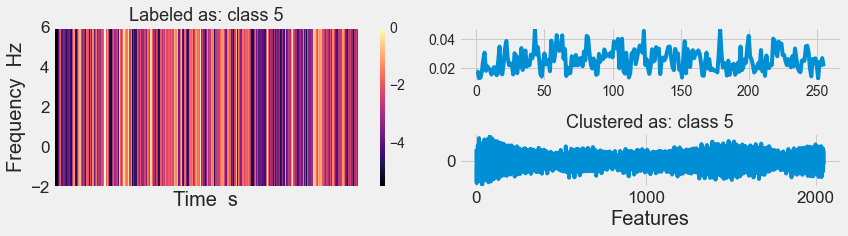

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


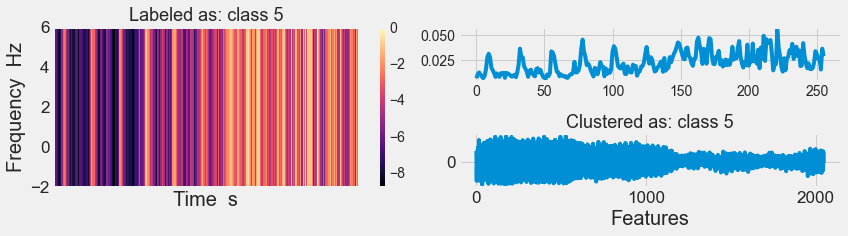

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


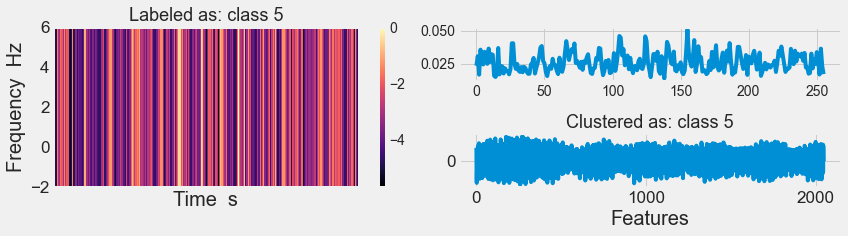

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


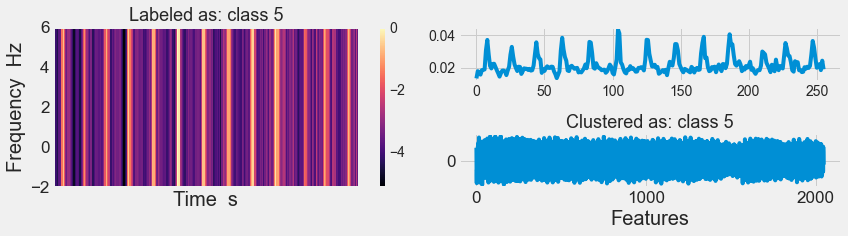

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


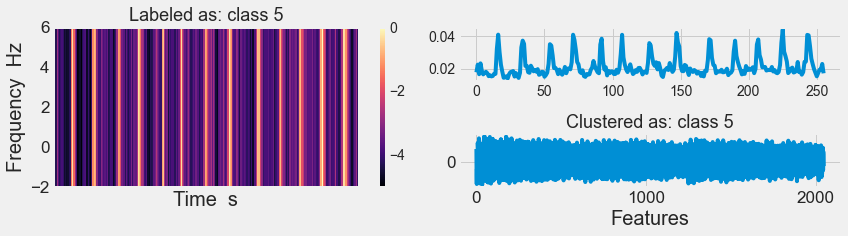

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


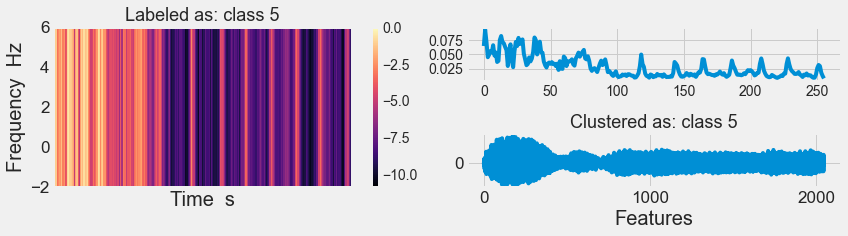

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


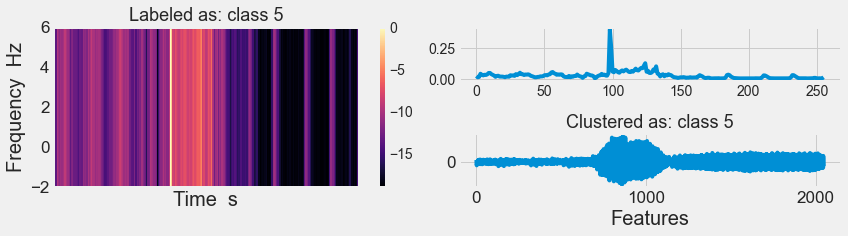

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


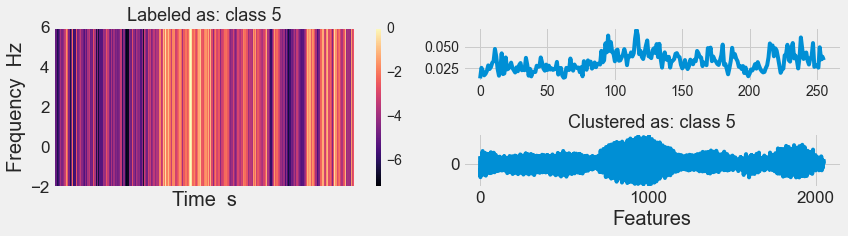

/Users/zali/opt/anaconda3/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  return f(*args, **kwargs)


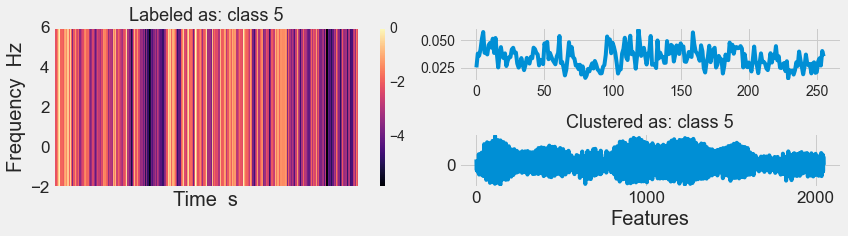

In [88]:
import librosa
import librosa.display

q, _  = model.predict(x, verbose=0)
y_pred = q.argmax(1)
enc = encoder.predict(x)
#t = np.load('t.npy')
#f = np.load('f.npy')

n_clusters=6
for i in range(0, 5799, 20):    
    
    if y_pred[i] == 5:
        fig = plt.figure(figsize=(12, 3.5))     
        ax = fig.add_subplot(222)
        plt.plot(x[i])
        ax = fig.add_subplot(121)
        librosa.display.specshow(librosa.power_to_db(x2[i], ref=np.max),y_axis='linear', sr=8)
        #plt.pcolormesh(t, f, x[i, :, :, 0], alpha=None, cmap='hot', shading='flat', antialiased=True)
        plt.ylabel('Frequency  Hz',  fontsize=20)
        plt.xlabel('Time  s', fontsize=20)
        plt.yticks(fontsize=17)
        plt.xticks(fontsize=17)
        plt.colorbar()
       
        #if y[i] == 2.0:
        plt.title('Labeled as: class 5', fontsize=18)
        #else:
        #    plt.title('Labeled as: other classes', fontsize=18)   
     
        ax = fig.add_subplot(224)
        #plt.imshow(enc[i].reshape(1, 64), cmap='viridis')
        plt.plot(enc[i])
        plt.xlabel('Features', fontsize=20)
        plt.yticks(np.arange(0, 1, step=1), fontsize=17)
        plt.xticks(np.arange(0, 2048, step=1000), fontsize=17)
        #plt.colorbar()

        #if y_pred[i] == 1.0:
        plt.title('Clustered as: class 5', fontsize=18)
        #else:
        #    plt.title('Clustered as: other classes', fontsize=18)
        fig.tight_layout()
        plt.show()

# Based on Eva's 6 clusters

In [103]:
y = np.load('labels.npy') # labels

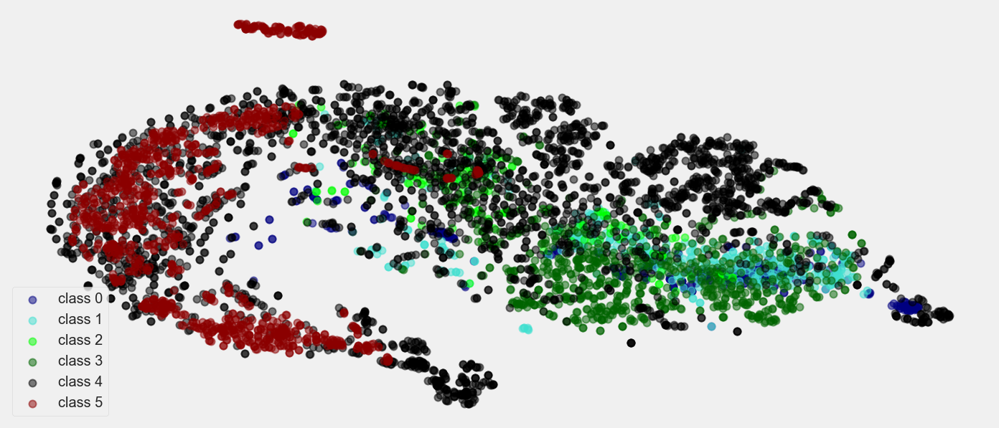

(<Figure size 1584x720 with 1 Axes>, <AxesSubplot:>)

In [101]:
def plotter(S, y, target_names):
    '''
    function to visualize the outputs of t-SNE
    '''
    # choose a color palette with seaborn.
    colors = ['navy', 'turquoise', 'lime','darkgreen','black','darkred','darkorange']
    lw = 2
    # create a scatter plot.
    f = plt.figure(figsize=(22, 10))
    ax = f.add_subplot(111)
    for color, i, target_name in zip(colors, [0, 1, 2, 3, 4, 5], target_names):
        plt.scatter(S[y == i, 0], S[y == i, 1], color=color, alpha=.5, lw=lw, s=100, label=target_name)
    plt.legend(loc='lower left', shadow=False, scatterpoints=1, prop={'size': 20})
    ax.axis('off')
    ax.axis('tight') 
    plt.show()

    return f, ax

enc = encoder.predict(x)
from sklearn.manifold import TSNE
redu = TSNE(random_state=123).fit_transform(enc)
target_names = ['class 0', 'class 1', 'class 2', 'class 3', 'class 4', 'class 5']
plotter(redu, y, target_names) 
